# **Used Cars Price Prediction**

## Notes for the grader
The flow of the notebook is as follows:
- EDA with unvariate graphs
- Then I created 5 datasets: original, dropna, knn imputed, iterative imputed and simple imputed
- For each of the 5 datasets:
  - Bivariate graphs
  - Correlation matrix
  - Transformations
  - Run Regression fit, score, predicitons, MSE calc
  - Test for Assumptions of linear regression (Linearity, Independence, Homoscedasticity, Normality, No multicollinearity, No endogeneity)
- Based on the Assumptions of linear regression, choose the best datasets
- Run Random forest and decision Tree on the top 2 datastes
- Report findings





## **Problem Definition**

### **The Context:**

 - Why is this problem important to solve?
   - Competitive pricing for used cars

### **The objective:**

 - What is the intended goal?
   - Predict as accurately as possible
   - Maximize customer price and dealer price

### **The key questions:**

- What are the key questions that need to be answered?
  - How do we do feature selection?
  - What are we going to do with NA values?
  - What tuning is the best for each model

### **The problem formulation**:
- Handle NA values
- Try out 3 models
- Report based on score and MSE

### **Data Dictionary**

**S.No.** : Serial Number

**Name** : Name of the car which includes Brand name and Model name

**Location** : The location in which the car is being sold or is available for purchase (Cities)

**Year** : Manufacturing year of the car

**Kilometers_driven** : The total kilometers driven in the car by the previous owner(s) in KM

**Fuel_Type** : The type of fuel used by the car (Petrol, Diesel, Electric, CNG, LPG)

**Transmission** : The type of transmission used by the car (Automatic / Manual)

**Owner** : Type of ownership

**Mileage** : The standard mileage offered by the car company in kmpl or km/kg

**Engine** : The displacement volume of the engine in CC

**Power** : The maximum power of the engine in bhp

**Seats** : The number of seats in the car

**New_Price** : The price of a new car of the same model in INR 100,000

**Price** : The price of the used car in INR 100,000 (**Target Variable**)

### **Loading libraries**

In [1]:
# import libraries for data manipulation
import numpy
import pandas

# import libraries for data visualization
import matplotlib.pyplot as pyplot
import seaborn

from google.colab import drive

# Sci Kit Learn
from sklearn.experimental import enable_iterative_imputer
import sklearn.impute as imp
import sklearn.preprocessing as prep

### **Let us load the data**

In [2]:
# read the data from my personal Google Drive as a Pandas Df
drive.mount("/content/gdrive", force_remount=True)
used_car_prices_df = pandas.read_csv('gdrive/My Drive/Colab Notebooks/Datasets/UsedCarPrices.csv')
# used_car_prices_df = pandas.read_csv('UsedCarPrices.csv')

# Print the first 5 rows, including column headers
used_car_prices_df.head()

Mounted at /content/gdrive


,S.No.,Name,Location,Year,Kilometers_Driven,Fuel_Type,Transmission,Owner_Type,Mileage,Engine,Power,Seats,New_price,Price
0,0,Maruti Wagon R LXI CNG,Mumbai,2010,72000,CNG,Manual,First,26.60,998.0,58.16,5.0,NaN,1.75
1,1,Hyundai Creta 1.6 CRDi SX Option,Pune,2015,41000,Diesel,Manual,First,19.67,1582.0,126.20,5.0,NaN,12.50
2,2,Honda Jazz V,Chennai,2011,46000,Petrol,Manual,First,18.20,1199.0,88.70,5.0,8.61,4.50
3,3,Maruti Ertiga VDI,Chennai,2012,87000,Diesel,Manual,First,20.77,1248.0,88.76,7.0,NaN,6.00
4,4,Audi A4 New 2.0 TDI Multitronic,Coimbatore,2013,40670,Diesel,Automatic,Second,15.20,1968.0,140.80,5.0,NaN,17.74


In [3]:
def print_basic_info(df):
  print("=== Number of cols = " + str(len(df.columns)) + ", and number of rows = " + str(len(df.index)) + " ===")
  df.info()
  df.isnull().sum()
  df.head()
  print("\n")

def print_scatterplot(df, title, num_cols=3, num_rows=3):
  # Create the subplots
  fig, axes = pyplot.subplots(nrows=num_cols, ncols=num_rows, figsize=(35,20))
  fig.subplots_adjust(hspace=0.4)
  fig.suptitle(title)

  for i, column in enumerate(df.columns):
    if i >= num_cols * num_rows:
      break
    seaborn.scatterplot(df, x=df["Price"], y=column, ax=axes[i//num_cols, i%num_cols])

def print_histograms(df, title, num_cols=4, num_rows=4):
  # Create the subplots
  fig, axes = pyplot.subplots(nrows=num_rows, ncols=num_cols, figsize=(20,10))
  fig.subplots_adjust(hspace=0.4)
  fig.suptitle(title)

  for i, column in enumerate(df.columns):
      seaborn.histplot(df[column], ax=axes[i//num_cols, i%num_cols], kde=True)


def print_correlation(df):
  print(df.corr())

  # plotting correlation heatmap
  pyplot.figure(figsize=(15,8))
  seaborn.heatmap(df.corr(), annot=True)

def print_all(df):
  print_basic_info(df)
  print_scatterplot(df)
  print_histograms(df)
  print_correlation(df)

## Data Overview

- Observations
- Sanity checks

In [4]:
print_basic_info(used_car_prices_df)

=== Number of cols = 14, and number of rows = 7253 ===
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7253 entries, 0 to 7252
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   S.No.              7253 non-null   int64  
 1   Name               7253 non-null   object 
 2   Location           7253 non-null   object 
 3   Year               7253 non-null   int64  
 4   Kilometers_Driven  7253 non-null   int64  
 5   Fuel_Type          7253 non-null   object 
 6   Transmission       7253 non-null   object 
 7   Owner_Type         7253 non-null   object 
 8   Mileage            7251 non-null   float64
 9   Engine             7207 non-null   float64
 10  Power              7078 non-null   float64
 11  Seats              7200 non-null   float64
 12  New_price          1006 non-null   float64
 13  Price              6019 non-null   float64
dtypes: float64(6), int64(3), object(5)
memory usage: 793.4+ KB




## Create 3 more datasets Imputed, Interpolated, and Regression Filled

In [5]:
# Add a new col: Brand to the original DF

# Sample name cell: "Maruti Wagon R LXI CNG"
def get_car_brand(row):
  name_parts = row.Name.split()
  return pandas.Series(name_parts[0], index=['Brand'])

used_car_prices_df['Brand'] = used_car_prices_df.apply(get_car_brand, axis=1)
used_car_prices_df.head()

,S.No.,Name,Location,Year,Kilometers_Driven,Fuel_Type,Transmission,Owner_Type,Mileage,Engine,Power,Seats,New_price,Price,Brand
0,0,Maruti Wagon R LXI CNG,Mumbai,2010,72000,CNG,Manual,First,26.60,998.0,58.16,5.0,NaN,1.75,Maruti
1,1,Hyundai Creta 1.6 CRDi SX Option,Pune,2015,41000,Diesel,Manual,First,19.67,1582.0,126.20,5.0,NaN,12.50,Hyundai
2,2,Honda Jazz V,Chennai,2011,46000,Petrol,Manual,First,18.20,1199.0,88.70,5.0,8.61,4.50,Honda
3,3,Maruti Ertiga VDI,Chennai,2012,87000,Diesel,Manual,First,20.77,1248.0,88.76,7.0,NaN,6.00,Maruti
4,4,Audi A4 New 2.0 TDI Multitronic,Coimbatore,2013,40670,Diesel,Automatic,Second,15.20,1968.0,140.80,5.0,NaN,17.74,Audi


In [6]:
label_encoder = prep.LabelEncoder()
used_car_prices_df['Brand'] = label_encoder.fit_transform(used_car_prices_df['Brand'])
used_car_prices_df['Name'] = label_encoder.fit_transform(used_car_prices_df['Name'])
used_car_prices_df['Location'] = label_encoder.fit_transform(used_car_prices_df['Location'])
used_car_prices_df['Fuel_Type'] = label_encoder.fit_transform(used_car_prices_df['Fuel_Type'])
used_car_prices_df['Transmission'] = label_encoder.fit_transform(used_car_prices_df['Transmission'])
used_car_prices_df['Owner_Type'] = label_encoder.fit_transform(used_car_prices_df['Owner_Type'])

In [7]:
used_car_prices_df.head()

,S.No.,Name,Location,Year,Kilometers_Driven,Fuel_Type,Transmission,Owner_Type,Mileage,Engine,Power,Seats,New_price,Price,Brand
0,0,1310,9,2010,72000,0,1,0,26.60,998.0,58.16,5.0,NaN,1.75,19
1,1,560,10,2015,41000,1,1,0,19.67,1582.0,126.20,5.0,NaN,12.50,11
2,2,529,2,2011,46000,4,1,0,18.20,1199.0,88.70,5.0,8.61,4.50,10
3,3,1160,2,2012,87000,1,1,0,20.77,1248.0,88.76,7.0,NaN,6.00,19
4,4,23,3,2013,40670,1,0,2,15.20,1968.0,140.80,5.0,NaN,17.74,1


In [8]:
used_car_prices_df_dropna = used_car_prices_df.dropna()
print_basic_info(used_car_prices_df_dropna)

=== Number of cols = 15, and number of rows = 823 ===
<class 'pandas.core.frame.DataFrame'>
Index: 823 entries, 2 to 6014
Data columns (total 15 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   S.No.              823 non-null    int64  
 1   Name               823 non-null    int64  
 2   Location           823 non-null    int64  
 3   Year               823 non-null    int64  
 4   Kilometers_Driven  823 non-null    int64  
 5   Fuel_Type          823 non-null    int64  
 6   Transmission       823 non-null    int64  
 7   Owner_Type         823 non-null    int64  
 8   Mileage            823 non-null    float64
 9   Engine             823 non-null    float64
 10  Power              823 non-null    float64
 11  Seats              823 non-null    float64
 12  New_price          823 non-null    float64
 13  Price              823 non-null    float64
 14  Brand              823 non-null    int64  
dtypes: float64(6), int64(9)


In [9]:
used_car_prices_df_dropna.head()

,S.No.,Name,Location,Year,Kilometers_Driven,Fuel_Type,Transmission,Owner_Type,Mileage,Engine,Power,Seats,New_price,Price,Brand
2,2,529,2,2011,46000,4,1,0,18.20,1199.0,88.70,5.0,8.61,4.50,10
7,7,1933,9,2016,36000,1,0,0,11.36,2755.0,171.50,8.0,21.00,17.50,30
10,10,1139,7,2018,25692,4,1,0,21.56,1462.0,103.25,5.0,10.65,9.95,19
15,15,1489,4,2014,110000,1,1,0,13.50,2477.0,175.56,7.0,32.01,15.00,22
20,20,76,7,2014,32982,1,0,0,22.69,1995.0,190.00,5.0,47.87,18.55,2


### Imputed

In [10]:
def get_imputed_df(imputer):
  label_encoder = prep.LabelEncoder()
  imputed_df = used_car_prices_df.copy(deep=True)

  imputed_df['Name'] = label_encoder.fit_transform(imputed_df['Name'])
  imputed_df['Location'] = label_encoder.fit_transform(imputed_df['Location'])
  imputed_df['Fuel_Type'] = label_encoder.fit_transform(imputed_df['Fuel_Type'])
  imputed_df['Transmission'] = label_encoder.fit_transform(imputed_df['Transmission'])
  imputed_df['Owner_Type'] = label_encoder.fit_transform(imputed_df['Owner_Type'])

  imputed_df = imputer.fit_transform(imputed_df)
  imputed_df = pandas.DataFrame(imputed_df, columns=used_car_prices_df.columns)
  imputed_df['Name_CATEGORICAL'] = used_car_prices_df['Name']
  imputed_df['Location_CATEGORICAL'] = used_car_prices_df['Location']
  imputed_df['Fuel_Type_CATEGORICAL'] = used_car_prices_df['Fuel_Type']
  imputed_df['Transmission_CATEGORICAL'] = used_car_prices_df['Transmission']
  imputed_df['Owner_Type_CATEGORICAL'] = used_car_prices_df['Owner_Type']

  return imputed_df


In [11]:
# From https://scikit-learn.org/stable/modules/classes.html#module-sklearn.impute

# impute.SimpleImputer(*[, missing_values, ...]) -> Univariate imputer for completing missing values with simple strategies.
# impute.IterativeImputer([estimator, ...]) -> Multivariate imputer that estimates each feature from all the others.
# impute.KNNImputer(*[, missing_values, ...]) -> Imputation for completing missing values using k-Nearest Neighbors.
knn_imputer = imp.KNNImputer(n_neighbors=2)

used_car_prices_df_knn_imputed_df = get_imputed_df(knn_imputer)
print_basic_info(used_car_prices_df_knn_imputed_df)

=== Number of cols = 20, and number of rows = 7253 ===
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7253 entries, 0 to 7252
Data columns (total 20 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   S.No.                     7253 non-null   float64
 1   Name                      7253 non-null   float64
 2   Location                  7253 non-null   float64
 3   Year                      7253 non-null   float64
 4   Kilometers_Driven         7253 non-null   float64
 5   Fuel_Type                 7253 non-null   float64
 6   Transmission              7253 non-null   float64
 7   Owner_Type                7253 non-null   float64
 8   Mileage                   7253 non-null   float64
 9   Engine                    7253 non-null   float64
 10  Power                     7253 non-null   float64
 11  Seats                     7253 non-null   float64
 12  New_price                 7253 non-null   float64
 13  Price   

In [12]:
simple_imputer = imp.SimpleImputer(missing_values=numpy.nan, strategy='mean')

used_car_prices_df_simple_imputed_df = get_imputed_df(simple_imputer)
print_basic_info(used_car_prices_df_simple_imputed_df)

=== Number of cols = 20, and number of rows = 7253 ===
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7253 entries, 0 to 7252
Data columns (total 20 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   S.No.                     7253 non-null   float64
 1   Name                      7253 non-null   float64
 2   Location                  7253 non-null   float64
 3   Year                      7253 non-null   float64
 4   Kilometers_Driven         7253 non-null   float64
 5   Fuel_Type                 7253 non-null   float64
 6   Transmission              7253 non-null   float64
 7   Owner_Type                7253 non-null   float64
 8   Mileage                   7253 non-null   float64
 9   Engine                    7253 non-null   float64
 10  Power                     7253 non-null   float64
 11  Seats                     7253 non-null   float64
 12  New_price                 7253 non-null   float64
 13  Price   

In [13]:
iterative_imputer = imp.IterativeImputer(random_state=0)

used_car_prices_df_iterative_imputed_df = get_imputed_df(iterative_imputer)
print_basic_info(used_car_prices_df_iterative_imputed_df)

=== Number of cols = 20, and number of rows = 7253 ===
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7253 entries, 0 to 7252
Data columns (total 20 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   S.No.                     7253 non-null   float64
 1   Name                      7253 non-null   float64
 2   Location                  7253 non-null   float64
 3   Year                      7253 non-null   float64
 4   Kilometers_Driven         7253 non-null   float64
 5   Fuel_Type                 7253 non-null   float64
 6   Transmission              7253 non-null   float64
 7   Owner_Type                7253 non-null   float64
 8   Mileage                   7253 non-null   float64
 9   Engine                    7253 non-null   float64
 10  Power                     7253 non-null   float64
 11  Seats                     7253 non-null   float64
 12  New_price                 7253 non-null   float64
 13  Price   

## **Exploratory Data Analysis (Milestone)**

- EDA is an important part of any project involving data.
- It is important to investigate and understand the data better before building a model with it.
- A few questions have been mentioned below which will help you approach the analysis in the right manner and generate insights from the data.
- A thorough analysis of the data, in addition to the questions mentioned below, should be done.

**Questions:**

1. Do univariate analysis for numerical and categorical variables?
2. Check the distribution of the different variables? is the distributions skewed?
3. Do we need to do log_transformation, if so for what variables we need to do?
4. Perfoem the log_transformation(if needed) and write down your observations?

## Display histograms of each colum to get a sense of their distribution

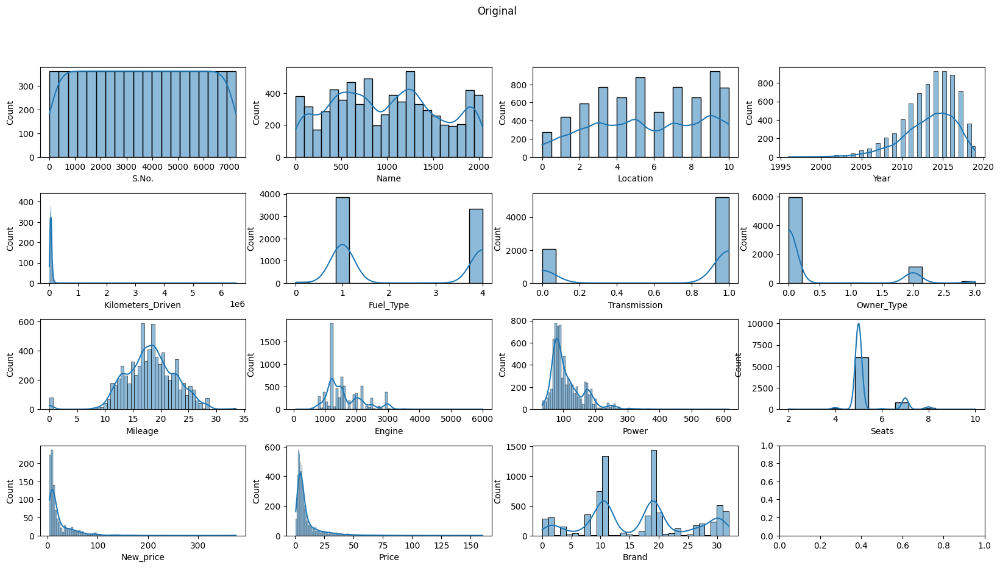

In [14]:
print_histograms(used_car_prices_df, "Original")

## **Univariate Analysis (Milestone)**

**Questions:**

1. What is the summary statistics of the data? Explore summary statistics for numerical variables and the categorical variables
2. Find out number of unique observations in each category of categorical columns? Write your findings/observations/insights
3. Check the extreme values in different columns of the given data and write down the observtions? Remove the data where the values are un-realistic

## **Bivariate Analysis**

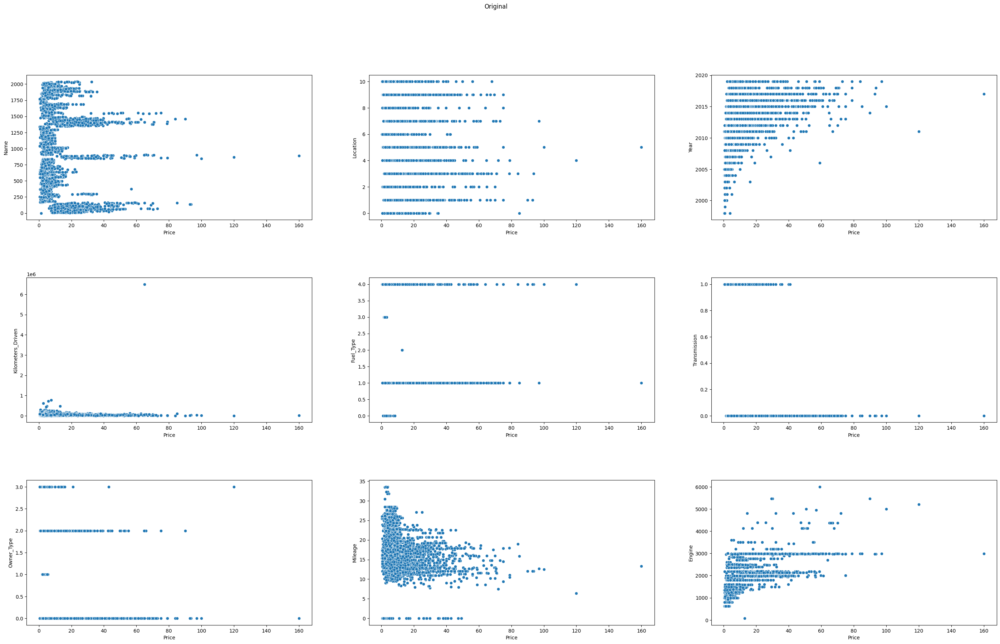

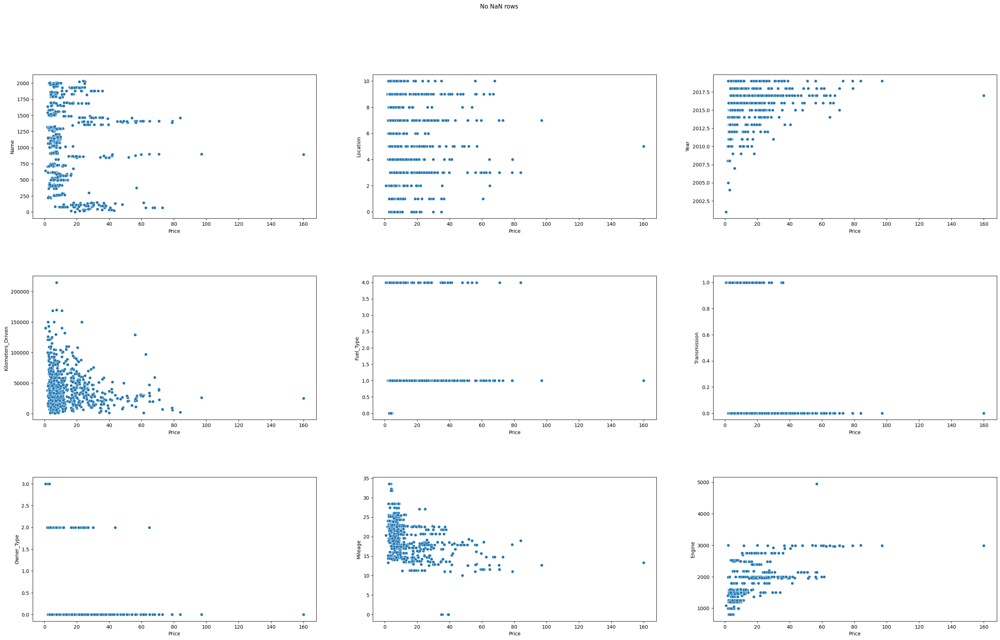

In [15]:
# Visualize the original Data and the price columns compard to other numerical columns
# print(used_car_prices_df.shape[1])

print_scatterplot(used_car_prices_df.drop(['S.No.'], axis=1).select_dtypes(include=numpy.number), "Original")
print_scatterplot(used_car_prices_df_dropna.drop(['S.No.'], axis=1).select_dtypes(include=numpy.number), "No NaN rows")

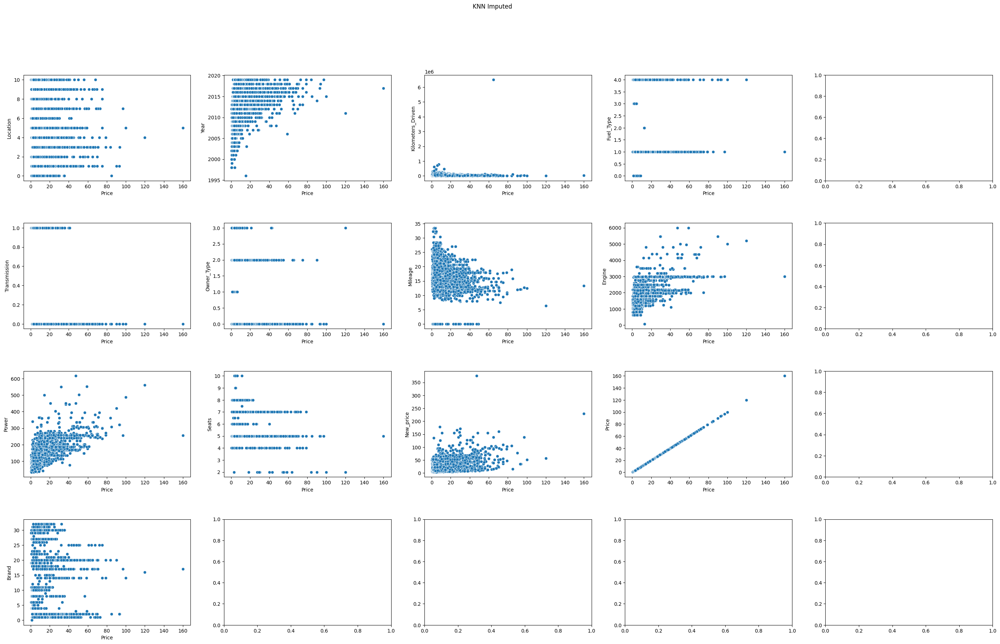

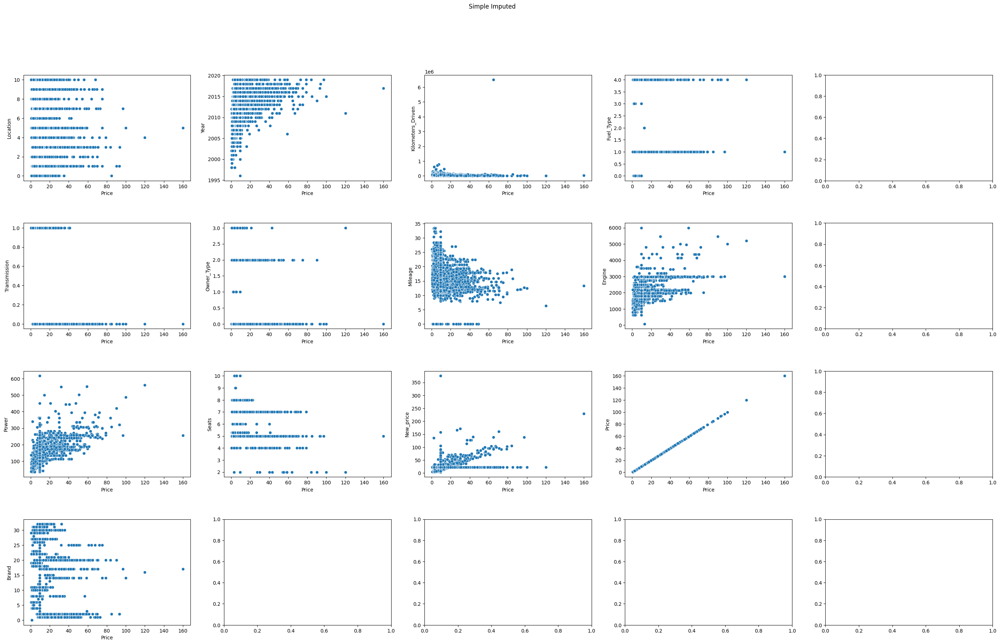

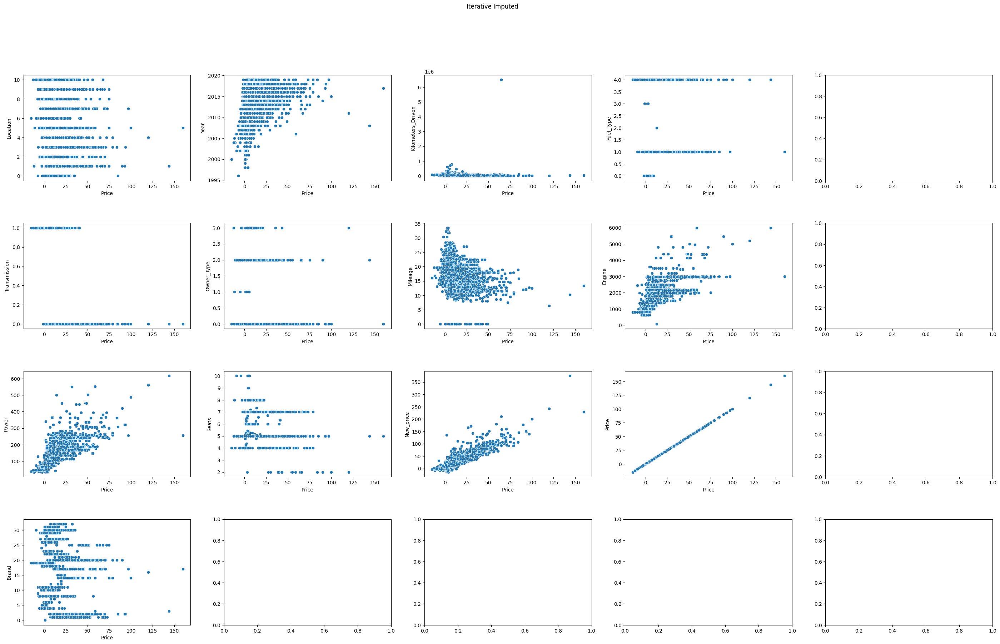

In [16]:
## # Visualize the Imputed Datasets and the price columns compared to other numerical columns
cols_to_drop = ['S.No.', 'Name', 'Name_CATEGORICAL' , 'Location_CATEGORICAL', 'Fuel_Type_CATEGORICAL', 'Transmission_CATEGORICAL', 'Owner_Type_CATEGORICAL']

print_scatterplot(used_car_prices_df_knn_imputed_df.drop(cols_to_drop, axis=1).select_dtypes(include=numpy.number), "KNN Imputed", num_rows=5, num_cols=4)
print_scatterplot(used_car_prices_df_simple_imputed_df.drop(cols_to_drop, axis=1).select_dtypes(include=numpy.number), "Simple Imputed", num_rows=5, num_cols=4)
print_scatterplot(used_car_prices_df_iterative_imputed_df.drop(cols_to_drop, axis=1).select_dtypes(include=numpy.number), "Iterative Imputed", num_rows=5, num_cols=4)

**Questions:
**

1. Plot a scatter plot for the log transformed values(if log_transformation done in previous steps)?
2. What can we infer form the correlation heatmap? Is there correlation between the dependent and independent variables?
3. Plot a box plot for target variable and categorical variable 'Location' and write your observations?

                      S.No.      Name  Location      Year  Kilometers_Driven  \
S.No.              1.000000 -0.001384 -0.006158  0.005573          -0.007697   
Name              -0.001384  1.000000  0.033469  0.016406           0.031892   
Location          -0.006158  0.033469  1.000000 -0.027455          -0.035586   
Year               0.005573  0.016406 -0.027455  1.000000          -0.187859   
Kilometers_Driven -0.007697  0.031892 -0.035586 -0.187859           1.000000   
Fuel_Type          0.017645 -0.072004  0.113209 -0.131888          -0.109530   
Transmission       0.020004  0.136026  0.048700 -0.099975           0.031166   
Owner_Type        -0.007748 -0.026578 -0.029547 -0.385503           0.088485   
Mileage            0.019104 -0.018891  0.020174  0.322463          -0.069122   
Engine            -0.014607  0.023813 -0.078240 -0.054693           0.094818   
Power             -0.021667 -0.149528 -0.069460  0.013432           0.030164   
Seats             -0.006587  0.162466 -0

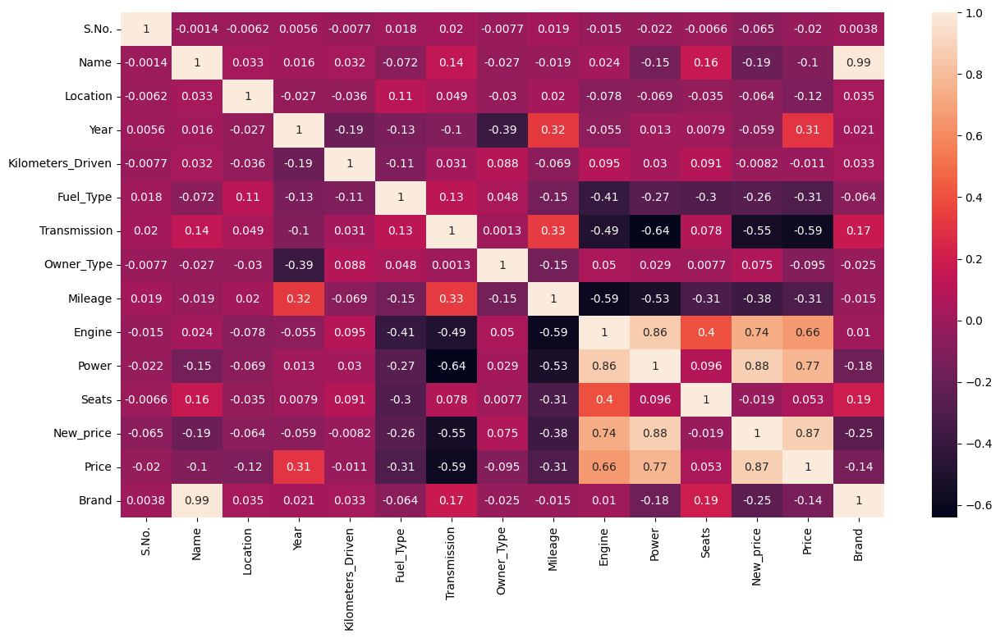

In [17]:
print_correlation(used_car_prices_df)

                      S.No.      Name  Location      Year  Kilometers_Driven  \
S.No.              1.000000  0.014277 -0.034994  0.007175          -0.047169   
Name               0.014277  1.000000 -0.001259  0.087813           0.044892   
Location          -0.034994 -0.001259  1.000000  0.080316          -0.185675   
Year               0.007175  0.087813  0.080316  1.000000          -0.520334   
Kilometers_Driven -0.047169  0.044892 -0.185675 -0.520334           1.000000   
Fuel_Type          0.066153 -0.029874  0.092334  0.020202          -0.287174   
Transmission       0.039344  0.130218  0.011827 -0.070032           0.139881   
Owner_Type         0.020517  0.015178 -0.073306 -0.307140           0.213418   
Mileage            0.123046 -0.151155  0.098437 -0.116559           0.042783   
Engine            -0.127056  0.040063 -0.097743  0.016253           0.129182   
Power             -0.108373 -0.147034 -0.051285 -0.017271           0.006821   
Seats             -0.113226  0.215491 -0

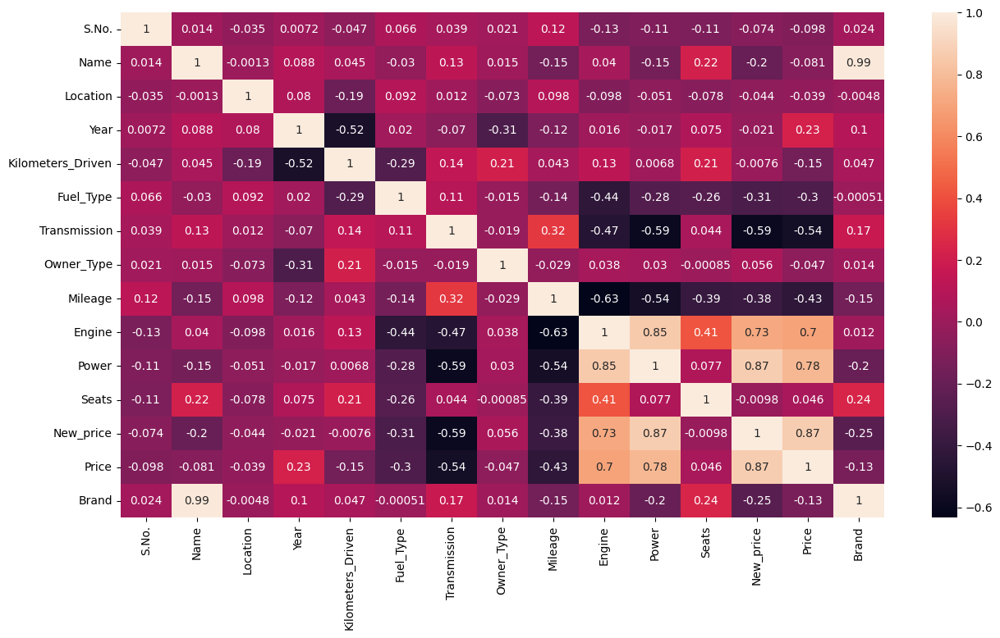

In [18]:
 print_correlation(used_car_prices_df_dropna)

                             S.No.      Name  Location      Year  \
S.No.                     1.000000 -0.001384 -0.006158  0.005573   
Name                     -0.001384  1.000000  0.033469  0.016406   
Location                 -0.006158  0.033469  1.000000 -0.027455   
Year                      0.005573  0.016406 -0.027455  1.000000   
Kilometers_Driven        -0.007697  0.031892 -0.035586 -0.187859   
Fuel_Type                 0.017645 -0.072004  0.113209 -0.131888   
Transmission              0.020004  0.136026  0.048700 -0.099975   
Owner_Type               -0.007748 -0.026578 -0.029547 -0.385503   
Mileage                   0.019083 -0.019105  0.019852  0.322600   
Engine                   -0.015428  0.023062 -0.076820 -0.054615   
Power                    -0.021925 -0.147719 -0.066558  0.022639   
Seats                    -0.006644  0.161691 -0.034424  0.006116   
New_price                -0.038293 -0.177812 -0.047076 -0.021291   
Price                    -0.063427 -0.087268 -0.

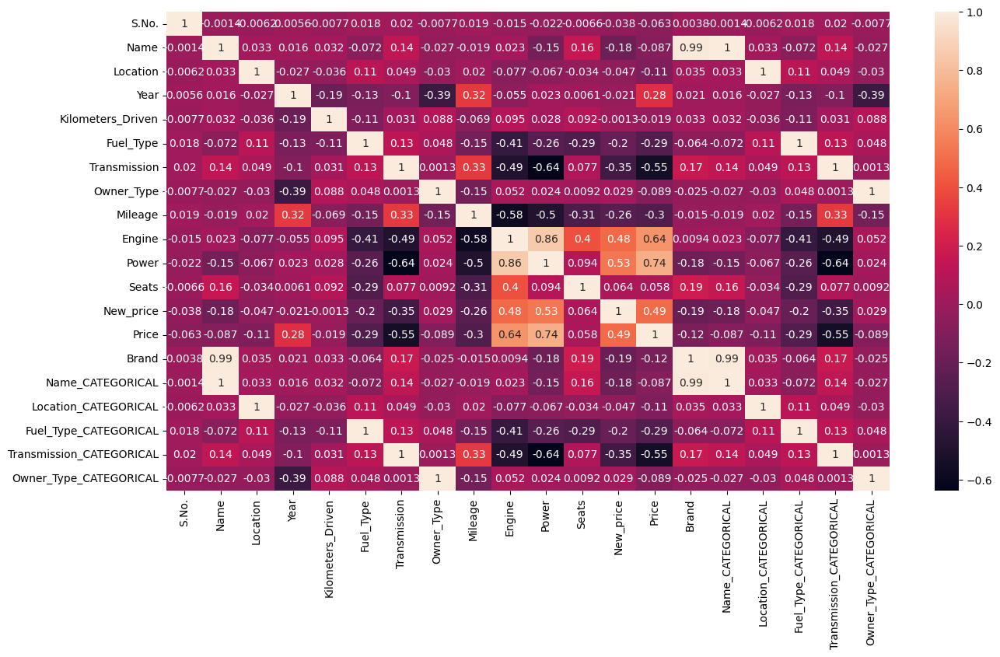

In [19]:
print_correlation(used_car_prices_df_knn_imputed_df)

                             S.No.      Name  Location      Year  \
S.No.                     1.000000 -0.001384 -0.006158  0.005573   
Name                     -0.001384  1.000000  0.033469  0.016406   
Location                 -0.006158  0.033469  1.000000 -0.027455   
Year                      0.005573  0.016406 -0.027455  1.000000   
Kilometers_Driven        -0.007697  0.031892 -0.035586 -0.187859   
Fuel_Type                 0.017645 -0.072004  0.113209 -0.131888   
Transmission              0.020004  0.136026  0.048700 -0.099975   
Owner_Type               -0.007748 -0.026578 -0.029547 -0.385503   
Mileage                   0.019104 -0.018888  0.020170  0.322437   
Engine                   -0.014565  0.023746 -0.077912 -0.054233   
Power                    -0.021394 -0.147955 -0.068498  0.012855   
Seats                    -0.006565  0.161952 -0.034768  0.007795   
New_price                -0.024699 -0.072720 -0.023354 -0.015737   
Price                    -0.015327 -0.092164 -0.

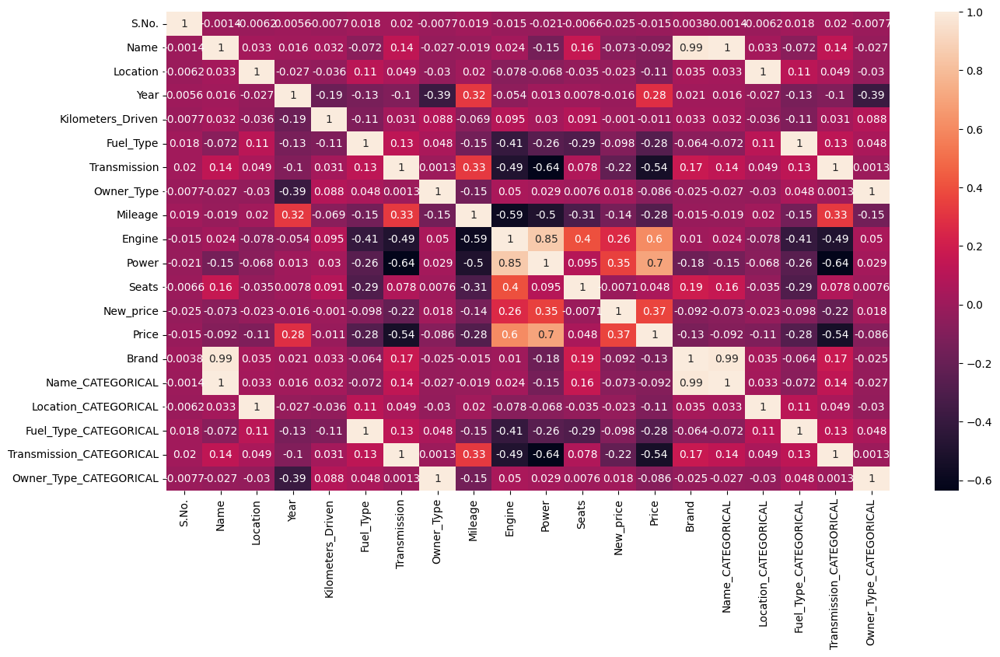

In [20]:
print_correlation(used_car_prices_df_simple_imputed_df)

                             S.No.      Name  Location      Year  \
S.No.                     1.000000 -0.001384 -0.006158  0.005573   
Name                     -0.001384  1.000000  0.033469  0.016406   
Location                 -0.006158  0.033469  1.000000 -0.027455   
Year                      0.005573  0.016406 -0.027455  1.000000   
Kilometers_Driven        -0.007697  0.031892 -0.035586 -0.187859   
Fuel_Type                 0.017645 -0.072004  0.113209 -0.131888   
Transmission              0.020004  0.136026  0.048700 -0.099975   
Owner_Type               -0.007748 -0.026578 -0.029547 -0.385503   
Mileage                   0.019156 -0.019002  0.019832  0.322594   
Engine                   -0.014978  0.023275 -0.077991 -0.056137   
Power                    -0.020081 -0.148319 -0.066786  0.026615   
Seats                    -0.007831  0.159525 -0.034349  0.006625   
New_price                 0.009534 -0.213288 -0.098060 -0.010978   
Price                    -0.026390 -0.100174 -0.

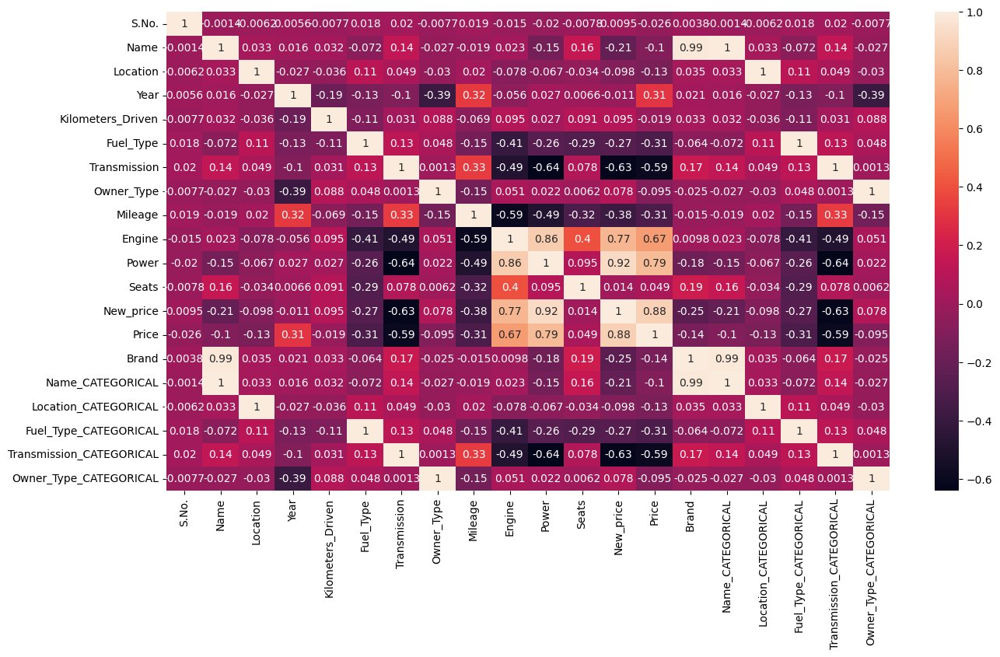

In [21]:
print_correlation(used_car_prices_df_iterative_imputed_df)

In [22]:
# Irrespective of the 5 data sets, the top dependent variables are
#   - Year
#   - Engine
#   - power
#   - New_price

# For each dataset:
#   - Do we need to do log_transformation for Linear Regress? If so for what variables we need to do?
#   - Do we need to do log_transformation, if so for what variables we need to do?
highly_correlated_columns = ["Price", "New_price", "Year", "Engine", "Power", "kpy", "Kilometers_Driven", "Brand"]
correlated_title_suffix = " with Highly Correlated"

def sqrt(x):
  return numpy.sqrt(x)

def recip(x):
  if x == 0:
    return 0
  else:
    return 1/x

def logt(x):
    return numpy.log(x + 1)

transformation_fns = [sqrt,  recip, logt]

def print_transformations(df, title):
  dfs = {}
  for func in transformation_fns:
    transformed_df = df.copy(deep=True)
    transformed_df = transformed_df[highly_correlated_columns]
    for col_name in highly_correlated_columns:
        new_column = transformed_df[col_name].apply(func)
        transformed_df[col_name + "_" + func.__name__] = new_column

    print_histograms(transformed_df, title + " - Transformations for " + func.__name__, num_cols=len(highly_correlated_columns), num_rows=2)
    dfs[func.__name__] = transformed_df

  return dfs

# Add a feature columns to calculate KM driven per year (km/age)
def km_driven_per_year(row):
  age = 2024 - row.Year
  return pandas.Series(row.Kilometers_Driven/age, index=['kpy'])

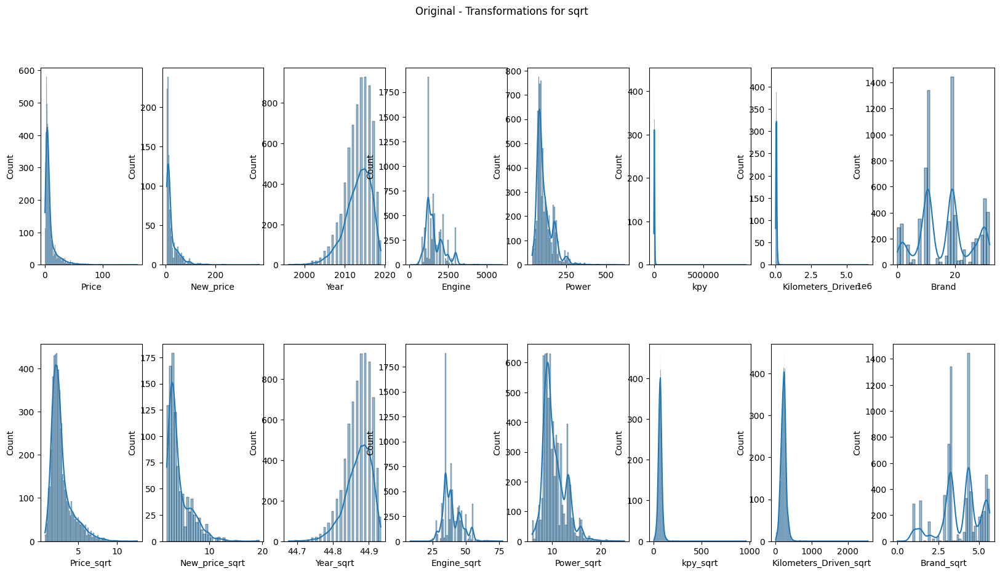

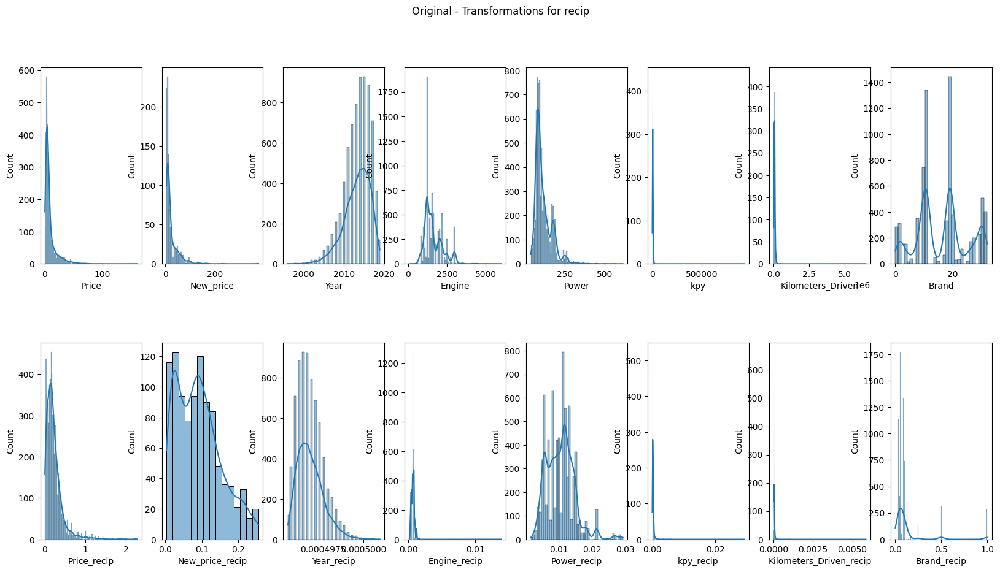

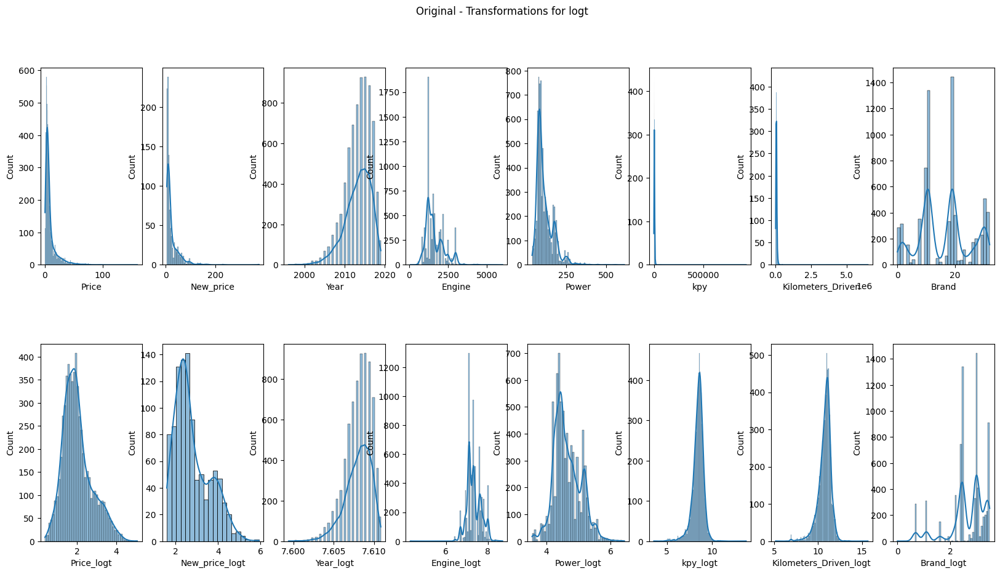

In [23]:
used_car_prices_df['kpy'] = used_car_prices_df.apply(km_driven_per_year, axis=1)
used_car_prices_df_transformed_dfs = print_transformations(used_car_prices_df, "Original")

In [24]:
used_car_prices_df_transformed = used_car_prices_df.copy(deep=True)
used_car_prices_df_transformed["New_price"] = used_car_prices_df_transformed_dfs["recip"]["New_price_recip"]
used_car_prices_df_transformed["Engine"] = used_car_prices_df_transformed_dfs["sqrt"]["Engine_sqrt"]
used_car_prices_df_transformed["Power"] = used_car_prices_df_transformed_dfs["logt"]["Power_logt"]
used_car_prices_df_transformed["Price"] = used_car_prices_df_transformed_dfs["logt"]["Price_logt"]
used_car_prices_df_transformed["kpy"] = used_car_prices_df_transformed_dfs["logt"]["kpy_logt"]
used_car_prices_df_transformed["Kilometers_Driven"] = used_car_prices_df_transformed_dfs["logt"]["Kilometers_Driven_logt"]

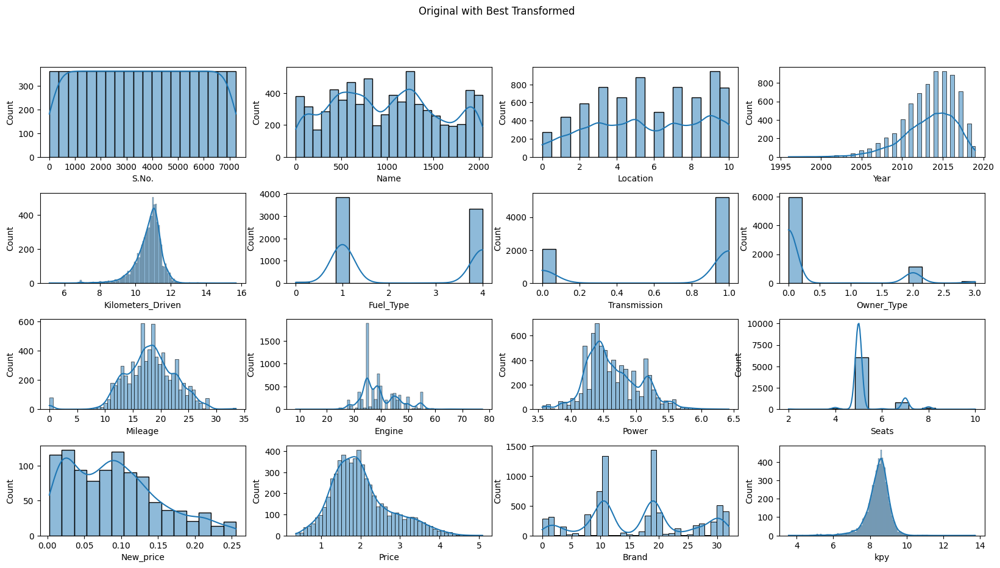

In [25]:
print_histograms(used_car_prices_df_transformed, "Original with Best Transformed")

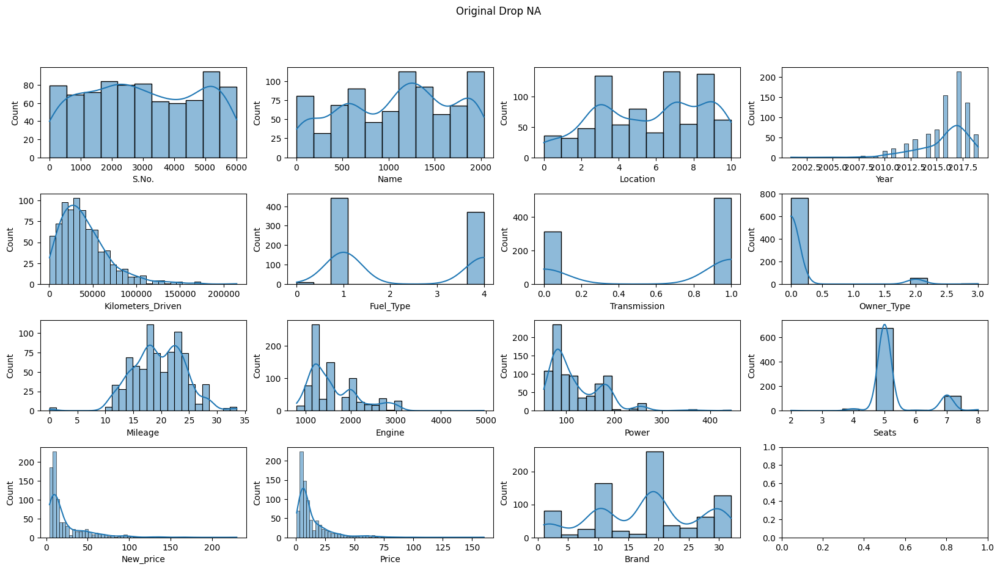

In [26]:
print_histograms(used_car_prices_df_dropna, "Original Drop NA")

In [27]:
used_car_prices_df_dropna.head()

,S.No.,Name,Location,Year,Kilometers_Driven,Fuel_Type,Transmission,Owner_Type,Mileage,Engine,Power,Seats,New_price,Price,Brand
2,2,529,2,2011,46000,4,1,0,18.20,1199.0,88.70,5.0,8.61,4.50,10
7,7,1933,9,2016,36000,1,0,0,11.36,2755.0,171.50,8.0,21.00,17.50,30
10,10,1139,7,2018,25692,4,1,0,21.56,1462.0,103.25,5.0,10.65,9.95,19
15,15,1489,4,2014,110000,1,1,0,13.50,2477.0,175.56,7.0,32.01,15.00,22
20,20,76,7,2014,32982,1,0,0,22.69,1995.0,190.00,5.0,47.87,18.55,2


<ipython-input-28-c4c9c68529f3>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  used_car_prices_df_dropna['kpy'] = used_car_prices_df_dropna.apply(km_driven_per_year, axis=1)


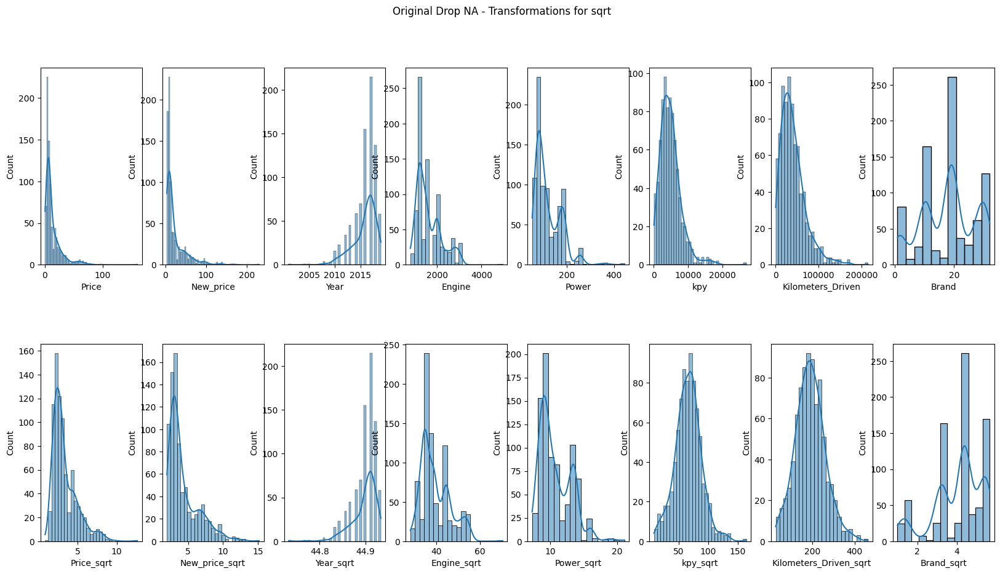

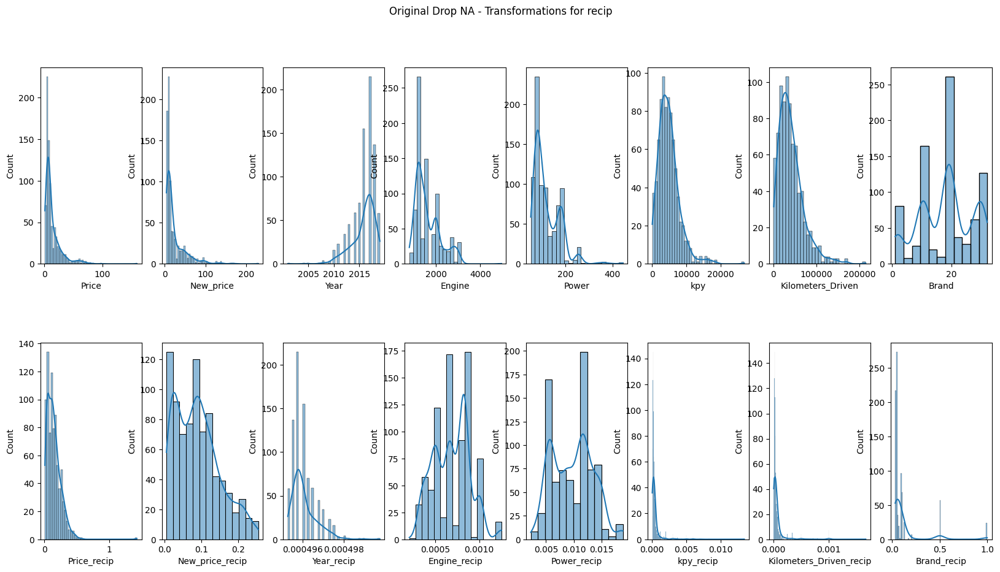

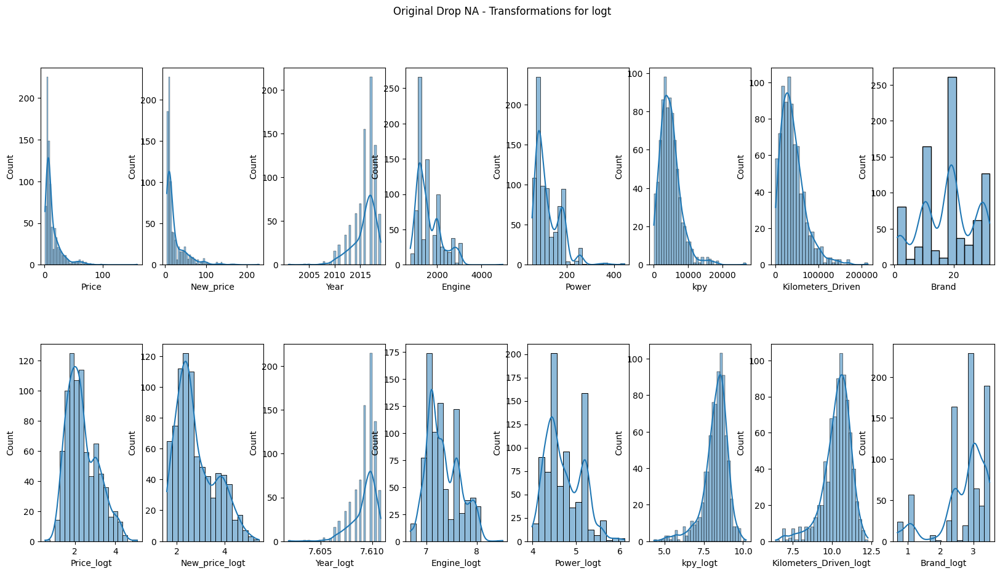

In [28]:
used_car_prices_df_dropna['kpy'] = used_car_prices_df_dropna.apply(km_driven_per_year, axis=1)
used_car_prices_df_dropna_transformed_dfs = print_transformations(used_car_prices_df_dropna, "Original Drop NA")

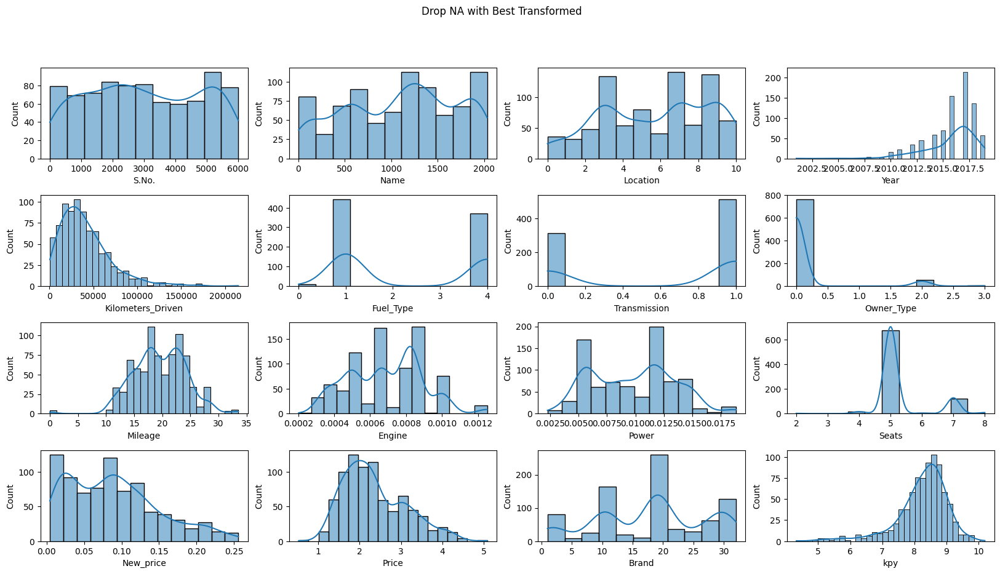

In [29]:
# Engine - recip
# Power - recip
# New_price - recip
# Price - logt
# Year - no

used_car_prices_df_dropna_transformed = used_car_prices_df_dropna.copy(deep=True)
used_car_prices_df_dropna_transformed["New_price"] = used_car_prices_df_dropna_transformed_dfs["recip"]["New_price_recip"]
used_car_prices_df_dropna_transformed["Engine"] = used_car_prices_df_dropna_transformed_dfs["recip"]["Engine_recip"]
used_car_prices_df_dropna_transformed["Power"] = used_car_prices_df_dropna_transformed_dfs["recip"]["Power_recip"]
used_car_prices_df_dropna_transformed["Price"] = used_car_prices_df_dropna_transformed_dfs["logt"]["Price_logt"]
used_car_prices_df_dropna_transformed["kpy"] = used_car_prices_df_dropna_transformed_dfs["logt"]["kpy_logt"]

print_histograms(used_car_prices_df_dropna_transformed, "Drop NA with Best Transformed")

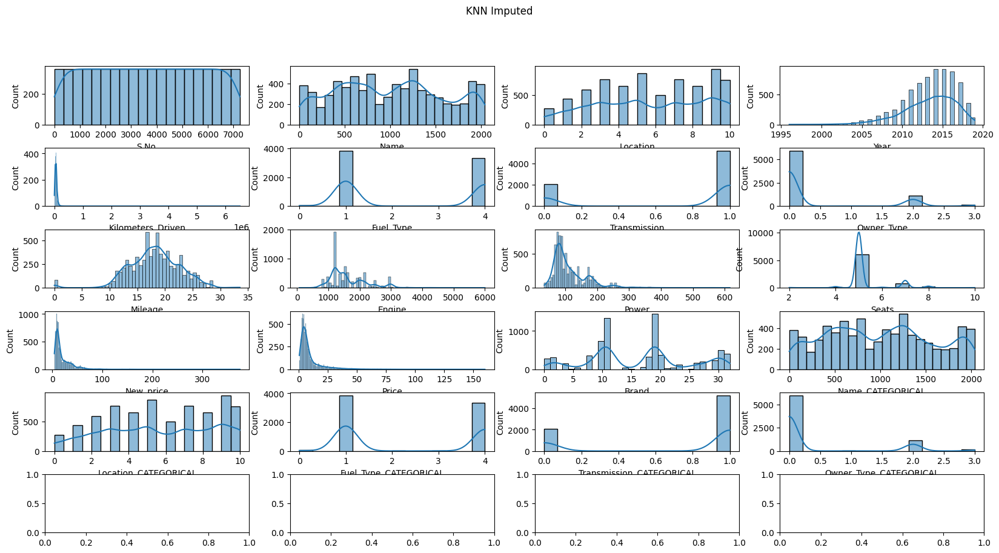

In [30]:
print_histograms(used_car_prices_df_knn_imputed_df, "KNN Imputed",  num_rows=6, num_cols=4)

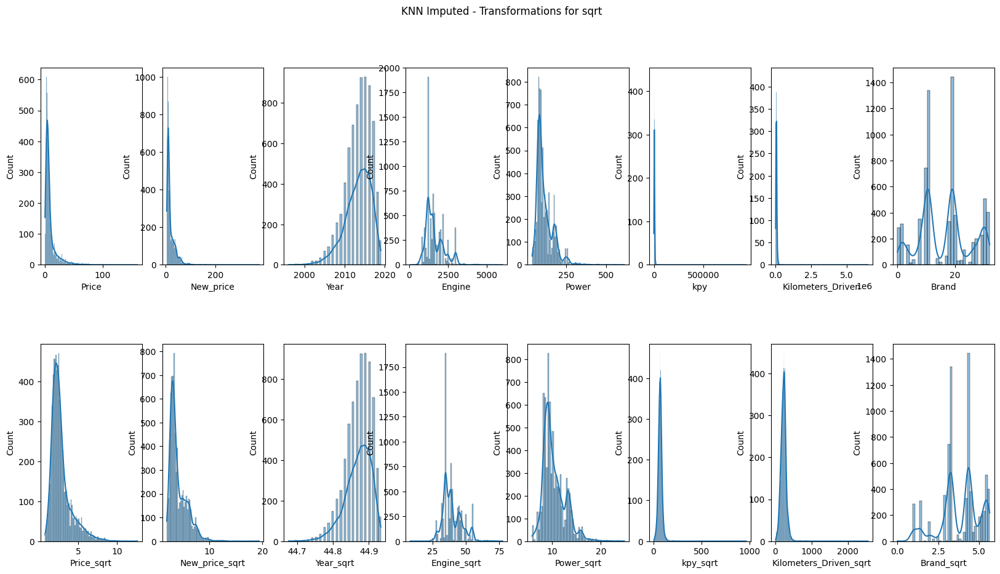

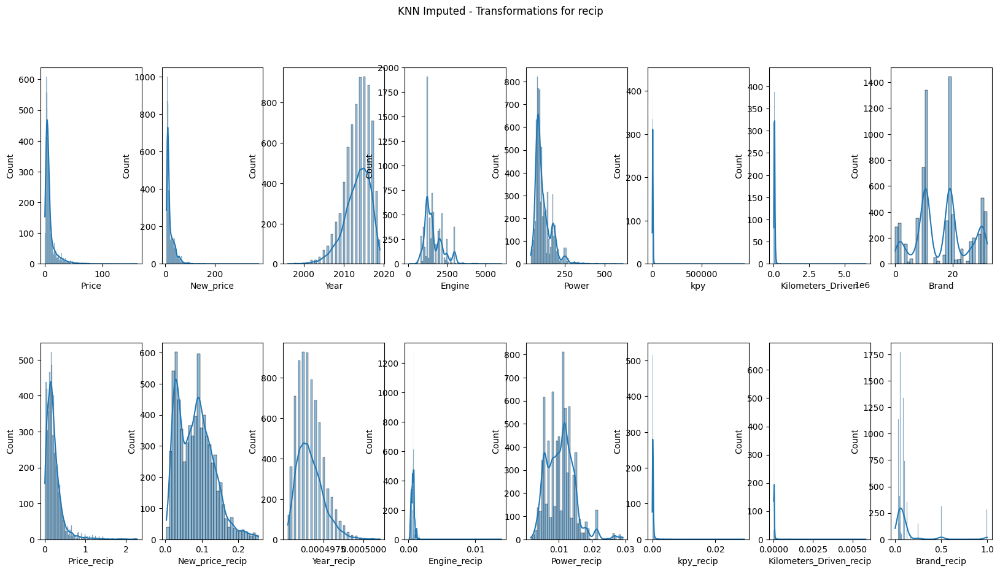

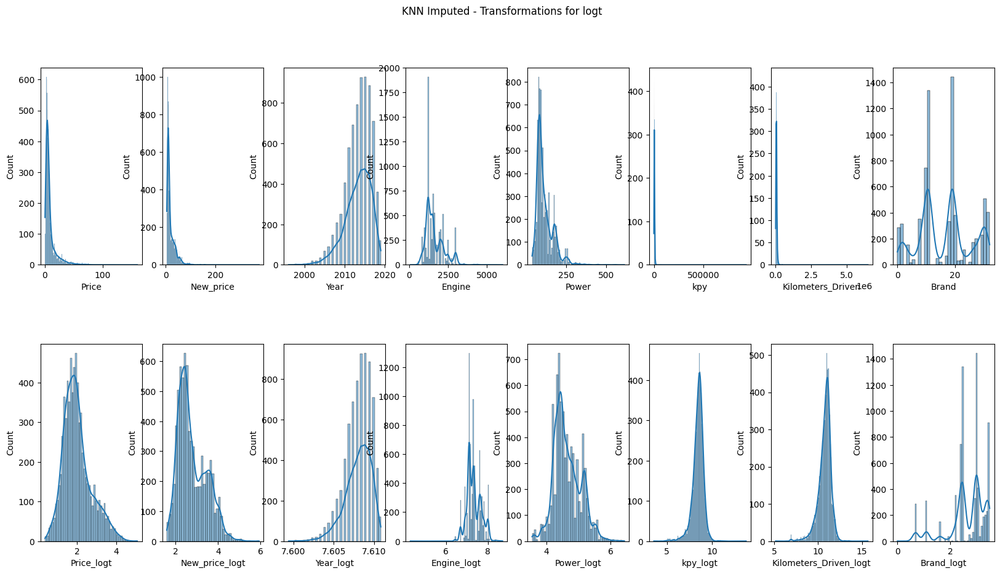

In [31]:
used_car_prices_df_knn_imputed_df['kpy'] = used_car_prices_df_knn_imputed_df.apply(km_driven_per_year, axis=1)
used_car_prices_df_knn_imputed_df_transformed_dfs = print_transformations(used_car_prices_df_knn_imputed_df, "KNN Imputed")

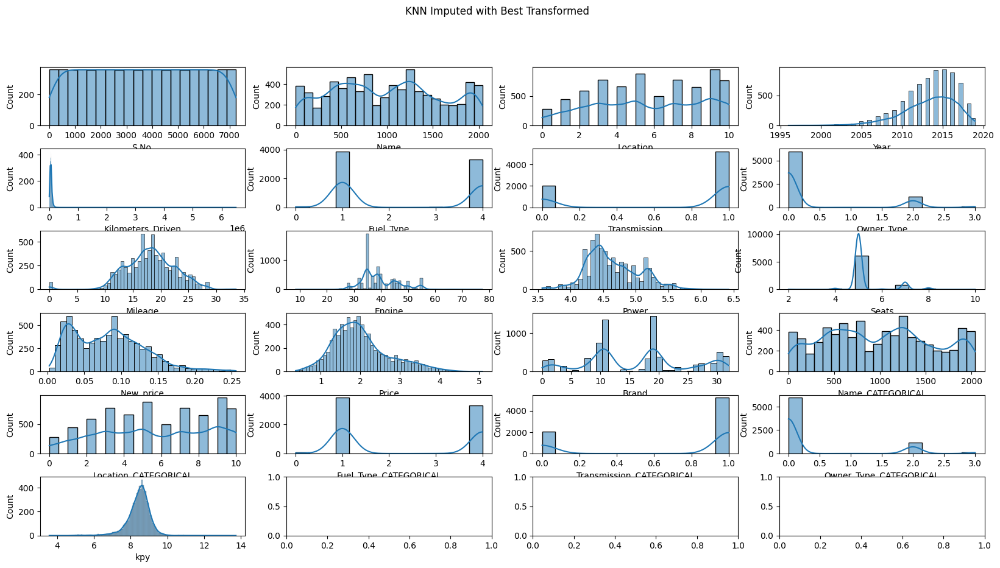

In [32]:
# Price - logt
# New_price - recip
# Year - none
# Engine - sqrt
# Power - logt

used_car_prices_df_knn_imputed_df_transformed = used_car_prices_df_knn_imputed_df.copy(deep=True)
used_car_prices_df_knn_imputed_df_transformed["Price"] = used_car_prices_df_knn_imputed_df_transformed_dfs["logt"]["Price_logt"]
used_car_prices_df_knn_imputed_df_transformed["New_price"] = used_car_prices_df_knn_imputed_df_transformed_dfs["recip"]["New_price_recip"]
used_car_prices_df_knn_imputed_df_transformed["Engine"] = used_car_prices_df_knn_imputed_df_transformed_dfs["sqrt"]["Engine_sqrt"]
used_car_prices_df_knn_imputed_df_transformed["Power"] = used_car_prices_df_knn_imputed_df_transformed_dfs["logt"]["Power_logt"]
used_car_prices_df_knn_imputed_df_transformed["kpy"] = used_car_prices_df_knn_imputed_df_transformed_dfs["logt"]["kpy_logt"]


print_histograms(used_car_prices_df_knn_imputed_df_transformed, "KNN Imputed with Best Transformed", num_rows=6, num_cols=4)

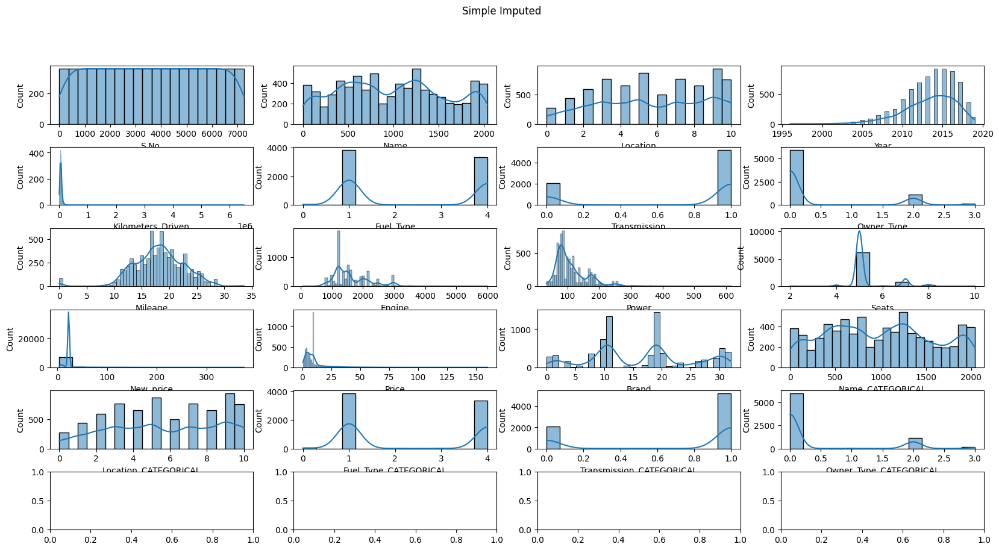

In [33]:
print_histograms(used_car_prices_df_simple_imputed_df, "Simple Imputed", num_rows=6, num_cols=4)

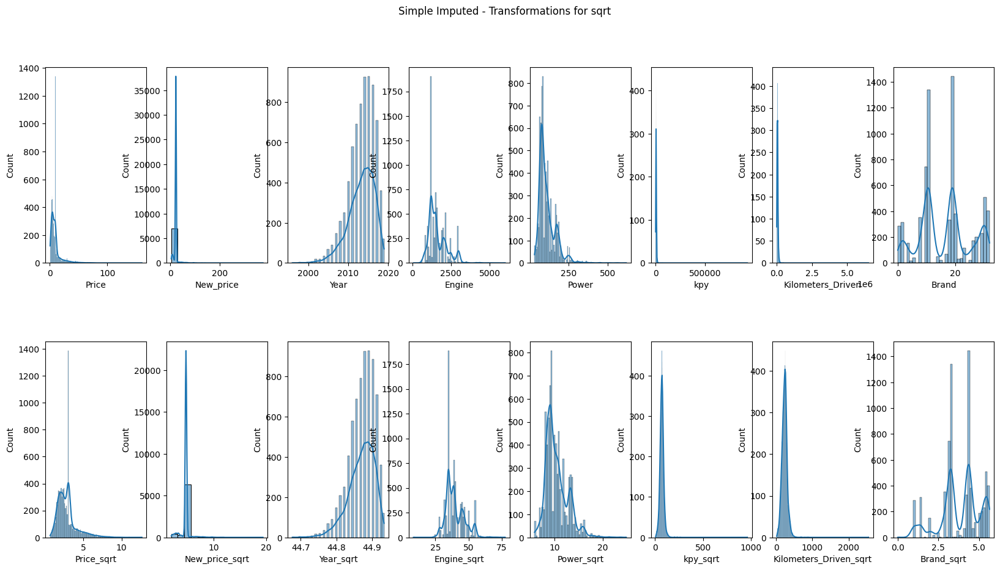

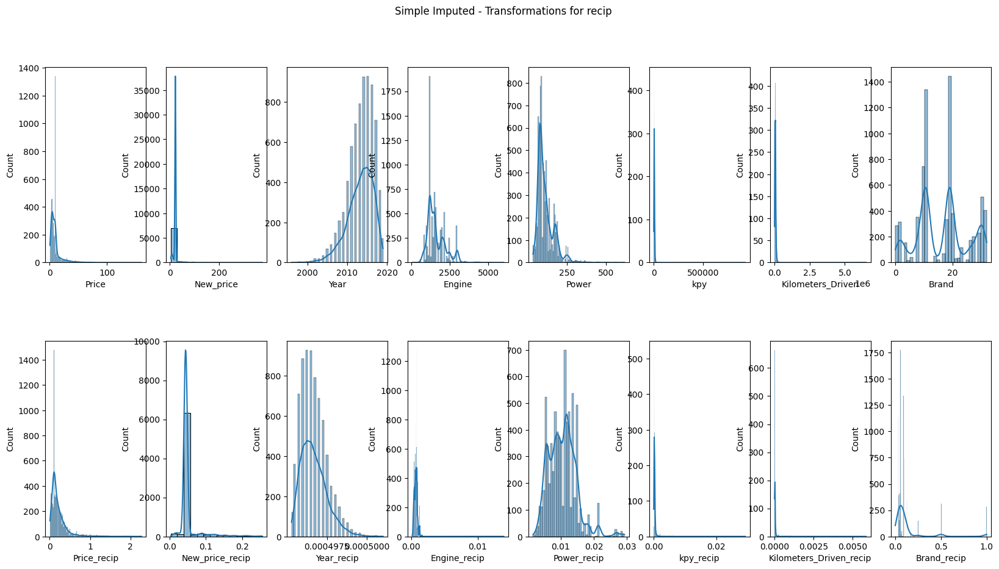

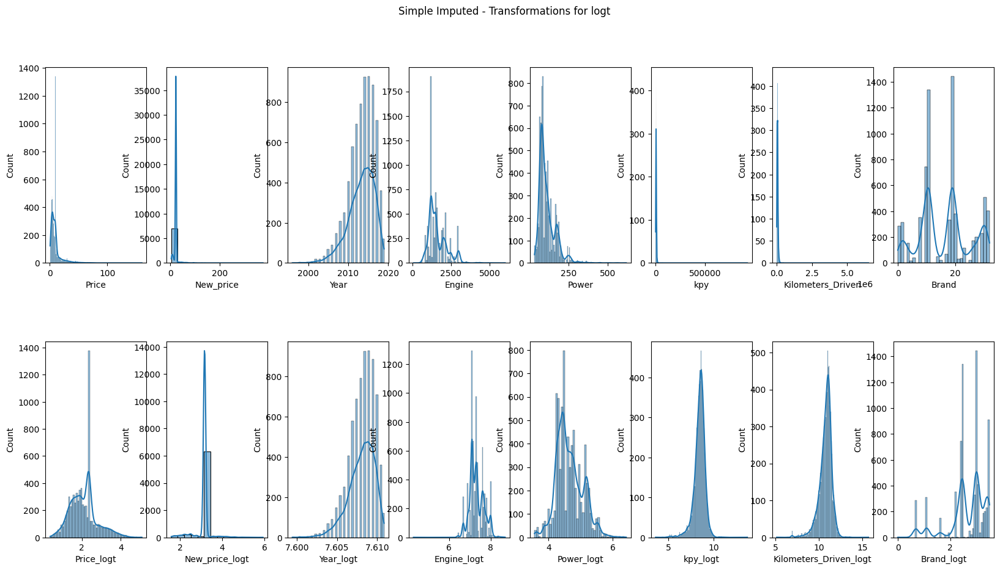

In [34]:
used_car_prices_df_simple_imputed_df['kpy'] = used_car_prices_df_simple_imputed_df.apply(km_driven_per_year, axis=1)
used_car_prices_df_simple_imputed_df_transformed_dfs = print_transformations(used_car_prices_df_simple_imputed_df, "Simple Imputed")

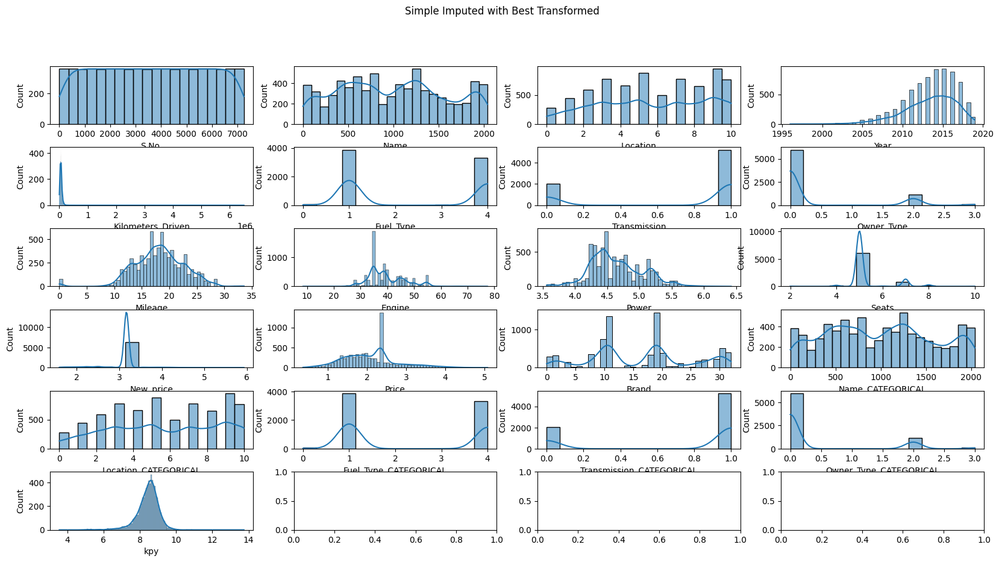

In [35]:
# Price - logt
# New_price - logt
# Year - none
# Engine - sqrt
# Power - logt

used_car_prices_df_simple_imputed_df_transformed = used_car_prices_df_simple_imputed_df.copy(deep=True)
used_car_prices_df_simple_imputed_df_transformed["Price"] = used_car_prices_df_simple_imputed_df_transformed_dfs["logt"]["Price_logt"]
used_car_prices_df_simple_imputed_df_transformed["New_price"] = used_car_prices_df_simple_imputed_df_transformed_dfs["logt"]["New_price_logt"]
used_car_prices_df_simple_imputed_df_transformed["Engine"] = used_car_prices_df_simple_imputed_df_transformed_dfs["sqrt"]["Engine_sqrt"]
used_car_prices_df_simple_imputed_df_transformed["Power"] = used_car_prices_df_simple_imputed_df_transformed_dfs["logt"]["Power_logt"]
used_car_prices_df_simple_imputed_df_transformed["kpy"] = used_car_prices_df_simple_imputed_df_transformed_dfs["logt"]["kpy_logt"]

print_histograms(used_car_prices_df_simple_imputed_df_transformed, "Simple Imputed with Best Transformed", num_rows=6, num_cols=4)

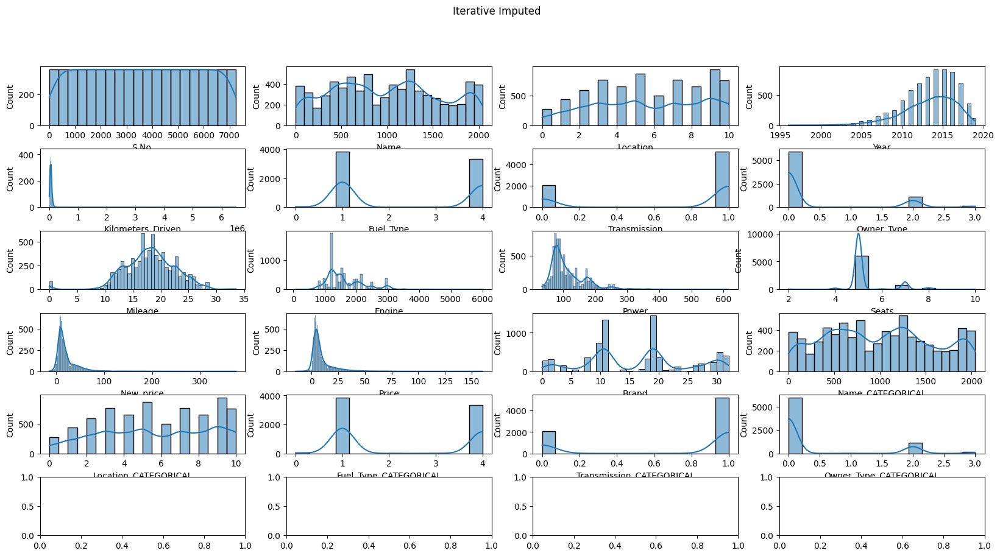

In [36]:
print_histograms(used_car_prices_df_iterative_imputed_df, "Iterative Imputed",  num_rows=6, num_cols=4)

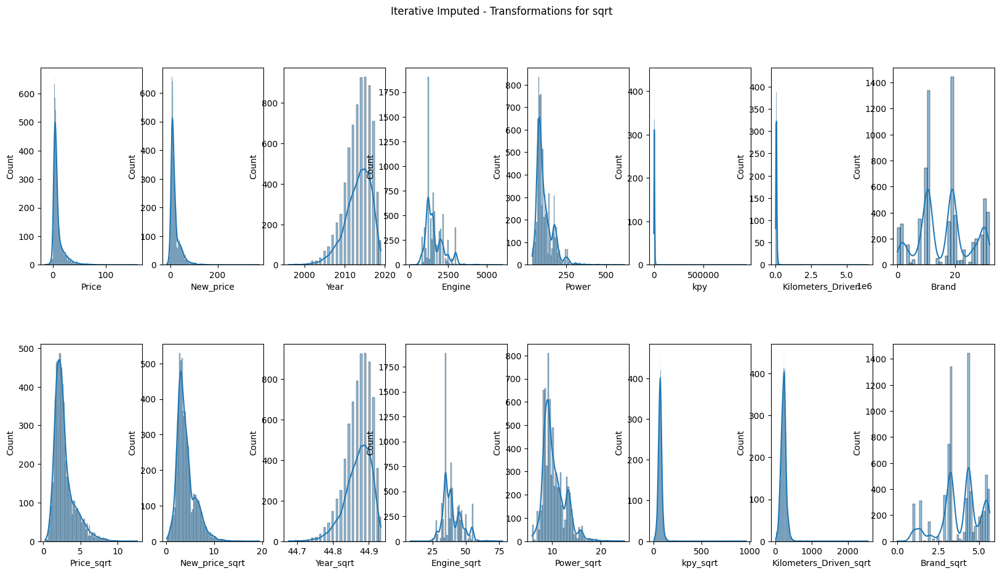

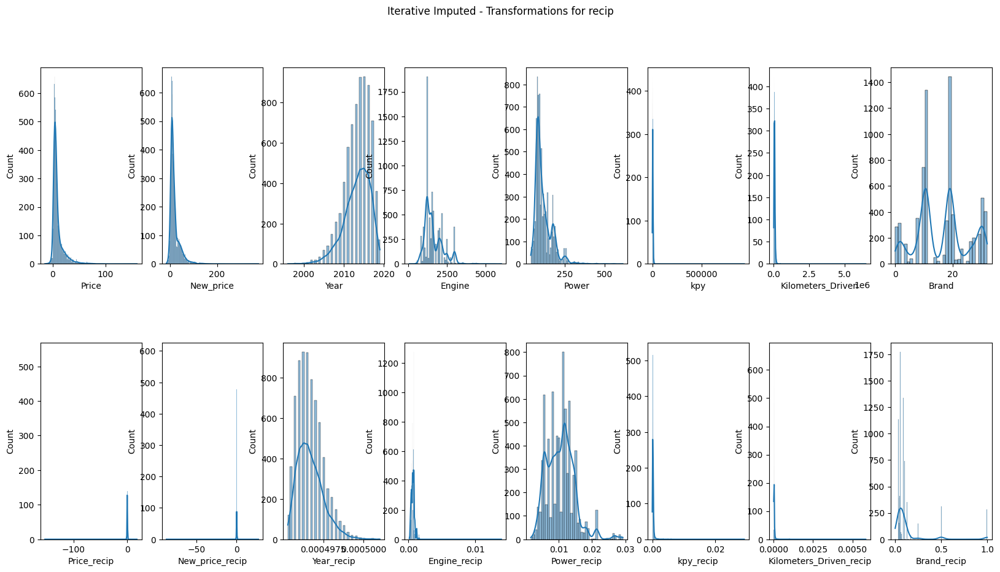

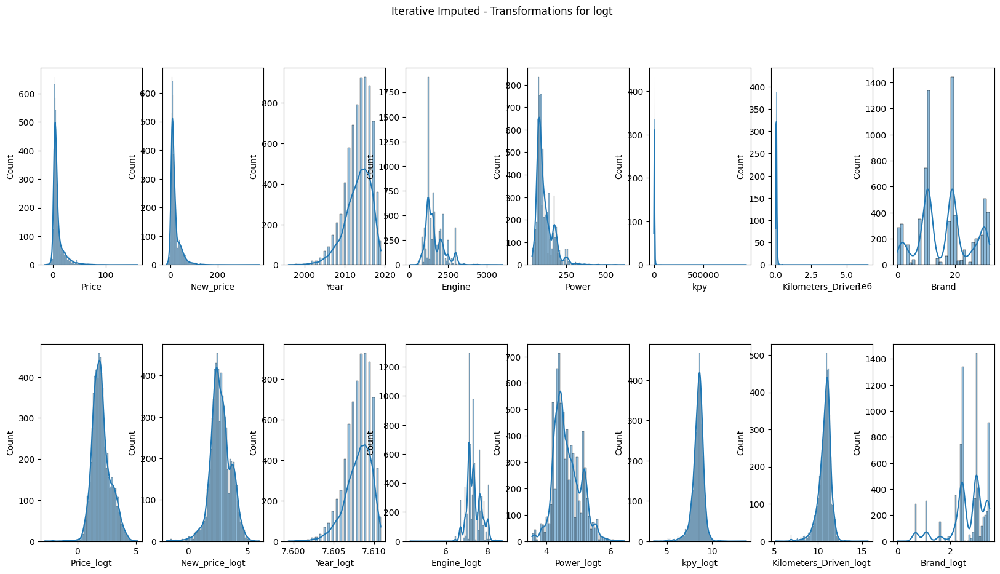

In [37]:
used_car_prices_df_iterative_imputed_df['kpy'] = used_car_prices_df_iterative_imputed_df.apply(km_driven_per_year, axis=1)
used_car_prices_df_iterative_imputed_df_transformed_dfs = print_transformations(used_car_prices_df_iterative_imputed_df, "Iterative Imputed")

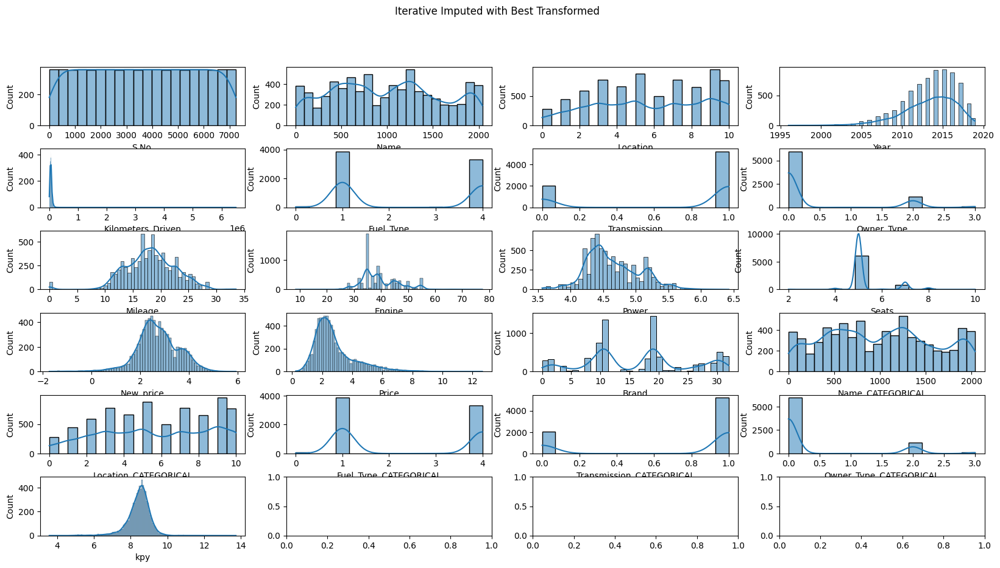

In [38]:
# Price - sqrt
# New_price - logt
# Year - none
# Engine - sqrt
# Power - logt

used_car_prices_df_iterative_imputed_df_transformed = used_car_prices_df_iterative_imputed_df.copy(deep=True)
used_car_prices_df_iterative_imputed_df_transformed["Price"] = used_car_prices_df_iterative_imputed_df_transformed_dfs["sqrt"]["Price_sqrt"]
used_car_prices_df_iterative_imputed_df_transformed["New_price"] = used_car_prices_df_iterative_imputed_df_transformed_dfs["logt"]["New_price_logt"]
used_car_prices_df_iterative_imputed_df_transformed["Engine"] = used_car_prices_df_iterative_imputed_df_transformed_dfs["sqrt"]["Engine_sqrt"]
used_car_prices_df_iterative_imputed_df_transformed["Power"] = used_car_prices_df_iterative_imputed_df_transformed_dfs["logt"]["Power_logt"]
used_car_prices_df_iterative_imputed_df_transformed["kpy"] = used_car_prices_df_iterative_imputed_df_transformed_dfs["logt"]["kpy_logt"]

print_histograms(used_car_prices_df_iterative_imputed_df_transformed, "Iterative Imputed with Best Transformed", num_rows=6, num_cols=4)

In [39]:
# Steps:
# - split
# - print

from sklearn import linear_model, model_selection
from sklearn import preprocessing

def run_regression(transformed_pandas_df):
  regress = linear_model.LinearRegression()
  # if pandas.api.types.infer_dtype(transformed_pandas_df["Name"]) == "string":
  #   print("name col is string")
  print("Cols pre trewatment")
  print(transformed_pandas_df.columns)
  if "S.No." in transformed_pandas_df.columns:
    transformed_pandas_df = transformed_pandas_df.drop(["S.No."], axis=1)
  if "Location_CATEGORICAL" in transformed_pandas_df.columns:
    transformed_pandas_df = transformed_pandas_df.drop(["Location_CATEGORICAL"], axis=1)
  if "Transmission_CATEGORICAL" in transformed_pandas_df.columns:
    transformed_pandas_df = transformed_pandas_df.drop(["Transmission_CATEGORICAL"], axis=1)
  if "Owner_Type_CATEGORICAL" in transformed_pandas_df.columns:
    transformed_pandas_df = transformed_pandas_df.drop(["Owner_Type_CATEGORICAL"], axis=1)
  if "Name_CATEGORICAL" in transformed_pandas_df.columns:
    transformed_pandas_df = transformed_pandas_df.drop(["Name_CATEGORICAL"], axis=1)
  if "Fuel_Type_CATEGORICAL" in transformed_pandas_df.columns:
    transformed_pandas_df = transformed_pandas_df.drop(["Fuel_Type_CATEGORICAL"], axis=1)

  print("Cols post trewatment")
  print(transformed_pandas_df.columns)

  # Split
  transformed_pandas_df_X = transformed_pandas_df.drop(['Price'], axis=1)
  transformed_pandas_df_Y = transformed_pandas_df['Price']
  transformed_pandas_df_X_train, transformed_pandas_df_X_test, transformed_pandas_df_Y_train, transformed_pandas_df_Y_test = model_selection.train_test_split(transformed_pandas_df_X, transformed_pandas_df_Y, test_size=0.2)
  transformed_pandas_df_train_data = transformed_pandas_df_X_train.join(transformed_pandas_df_Y_train)

  # Print histo
  transformed_pandas_df_train_data.hist(figsize=(15,8))

  # Print Correlation
  pyplot.figure(figsize=(15,8))
  seaborn.heatmap(transformed_pandas_df_train_data.corr(), annot=True)

  # Fit
  regress.fit(transformed_pandas_df_X_train, transformed_pandas_df_Y_train)

  # Score
  reg_score = regress.score(transformed_pandas_df_X_test, transformed_pandas_df_Y_test)
  print("Regression Score: " + str(reg_score))



  transformed_pandas_df_Y_pred = run_predictions(regress, transformed_pandas_df_X_test, transformed_pandas_df_Y_test)

  return (transformed_pandas_df_Y_test, transformed_pandas_df_Y_pred, transformed_pandas_df_X_test, transformed_pandas_df_X_train, transformed_pandas_df_Y_train)

from sklearn.metrics import mean_squared_error, r2_score

def run_predictions(regression, X_test, Y_test):
  Y_pred = regression.predict(X_test)

  # The coefficients
  if hasattr(regression, 'coef_'):
    print("Coefficients: \n", regression.coef_)

  # The mean squared error
  print("Mean squared error: %.2f" % mean_squared_error(Y_test, Y_pred))

  # The coefficient of determination: 1 is perfect prediction
  print("Coefficient of determination: %.2f" % r2_score(Y_test, Y_pred))

  return Y_pred

def test_linearity(Y_test, Y_pred, X_test):
  residuals = Y_test - Y_pred
  X_test['RESIDUALS'] = residuals
  X_test['PREDICTED'] = Y_pred

  # plot residuals to fitted to ensure no pattern
  pyplot.scatter(residuals, Y_pred)
  pyplot.show()

  # return residuals

import statsmodels.api as sm
def test_independence(residuals):
  sm.qqplot(residuals, line ='45')
  pyplot.show()

def test_homoscedasticity(X_test, Y_pred):
  mean = X_test["RESIDUALS"].mean()
  std = X_test["RESIDUALS"].std()

  X_test["STD_RESIDUAL"] = (X_test["RESIDUALS"] - mean)/std

  # plot residuals to fitted/predicted to ensure no pattern
  pyplot.scatter(X_test["STD_RESIDUAL"], Y_pred)
  pyplot.show()

from scipy import stats
def test_normality(Y_test):
  dist = stats.chi2(df=2)
  pdf = dist.pdf(Y_test)
  fig, ax = pyplot.subplots(figsize=(8, 5))
  ax.plot(Y_test, pdf)
  ax.set_title("Normality Test Null Distribution")
  ax.set_xlabel("statistic")
  ax.set_ylabel("probability density")
  pyplot.show()

import statsmodels.stats.outliers_influence as oi
def test_multicollinearity_and_vif(X_train):
  x_temp = sm.add_constant(X_train)

  vif = pandas.DataFrame()
  vif["VIF_FACTOR"] = [oi.variance_inflation_factor(x_temp.values, i) for i in range(x_temp.values.shape[1])]
  vif["FEATURES"] = x_temp.columns
  print(vif.round(1))

def test_endogeneity(residuals):
  pass
  # todo


Index(['Name', 'Location', 'Year', 'Kilometers_Driven', 'Fuel_Type',
       'Transmission', 'Owner_Type', 'Mileage', 'Engine', 'Power', 'Seats',
       'New_price', 'Price', 'Brand', 'kpy'],
      dtype='object')
Cols pre trewatment
Index(['Name', 'Location', 'Year', 'Kilometers_Driven', 'Fuel_Type',
       'Transmission', 'Owner_Type', 'Mileage', 'Engine', 'Power', 'Seats',
       'New_price', 'Price', 'Brand', 'kpy'],
      dtype='object')
Cols post trewatment
Index(['Name', 'Location', 'Year', 'Kilometers_Driven', 'Fuel_Type',
       'Transmission', 'Owner_Type', 'Mileage', 'Engine', 'Power', 'Seats',
       'New_price', 'Price', 'Brand', 'kpy'],
      dtype='object')
Regression Score: 0.29347962559596874
Coefficients: 
 [ 0.00067643 -0.01243461  0.05199876 -0.44880583 -0.09307306 -0.35691207
 -0.01215394 -0.02319279  0.03694029  0.02197278 -0.09388694 -0.51337018
 -0.05074859  0.38056281]
Mean squared error: 0.73
Coefficient of determination: 0.29


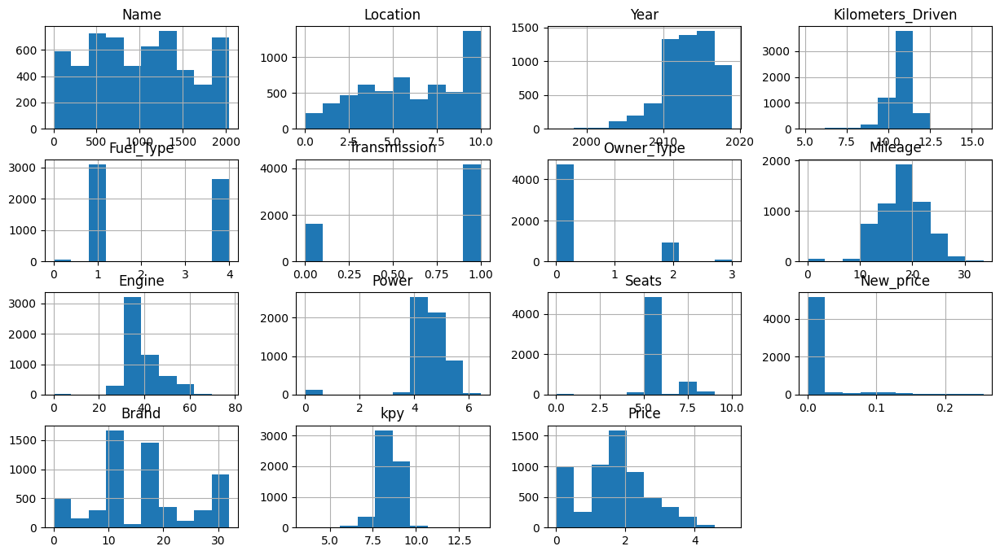

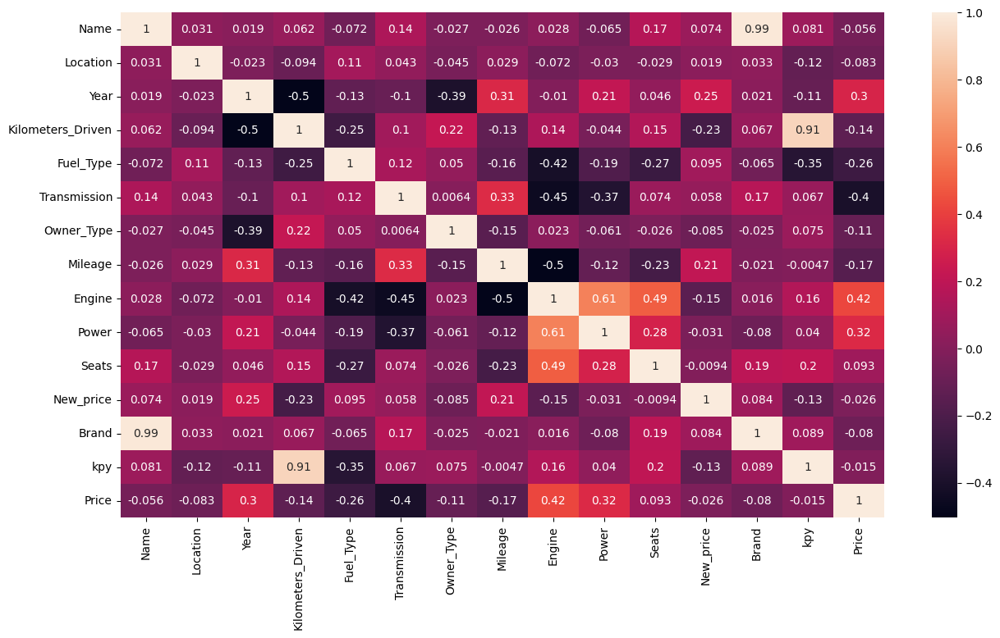

In [40]:
if "S.No." in used_car_prices_df_transformed.columns:
  used_car_prices_df_transformed = used_car_prices_df_transformed.drop(["S.No."], axis=1)

print(used_car_prices_df_transformed.columns)

# Transform the Categorical cols
label_encoder = prep.LabelEncoder()
used_car_prices_df_transformed['Name'] = label_encoder.fit_transform(used_car_prices_df_transformed['Name'])
used_car_prices_df_transformed['Location'] = label_encoder.fit_transform(used_car_prices_df_transformed['Location'])
used_car_prices_df_transformed['Fuel_Type'] = label_encoder.fit_transform(used_car_prices_df_transformed['Fuel_Type'])
used_car_prices_df_transformed['Transmission'] = label_encoder.fit_transform(used_car_prices_df_transformed['Transmission'])
used_car_prices_df_transformed['Owner_Type'] = label_encoder.fit_transform(used_car_prices_df_transformed['Owner_Type'])

used_car_prices_df_transformed = used_car_prices_df_transformed.fillna(0)
vanilla_Y_test, vanilla_Y_pred, vanilla_X_test, vanilla_X_train, vanilla_Y_train = run_regression(used_car_prices_df_transformed)

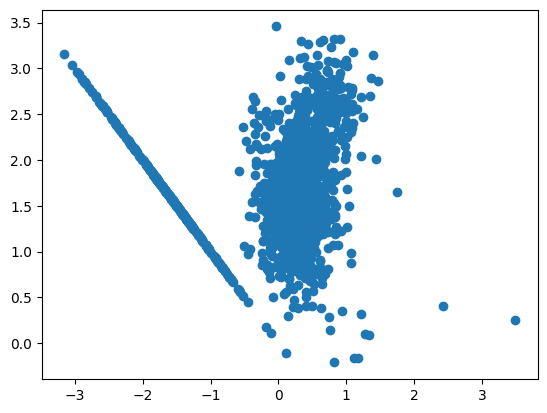

In [41]:
test_linearity(vanilla_Y_test, vanilla_Y_pred, vanilla_X_test)

Cols pre trewatment
Index(['S.No.', 'Name', 'Location', 'Year', 'Kilometers_Driven', 'Fuel_Type',
       'Transmission', 'Owner_Type', 'Mileage', 'Engine', 'Power', 'Seats',
       'New_price', 'Price', 'Brand', 'Name_CATEGORICAL',
       'Location_CATEGORICAL', 'Fuel_Type_CATEGORICAL',
       'Transmission_CATEGORICAL', 'Owner_Type_CATEGORICAL', 'kpy'],
      dtype='object')
Cols post trewatment
Index(['Name', 'Location', 'Year', 'Kilometers_Driven', 'Fuel_Type',
       'Transmission', 'Owner_Type', 'Mileage', 'Engine', 'Power', 'Seats',
       'New_price', 'Price', 'Brand', 'kpy'],
      dtype='object')
Regression Score: 0.7677444741514083
Coefficients: 
 [ 5.74386567e-04 -1.62515495e-02  8.71359395e-02 -3.78903010e-07
 -6.13188845e-02 -2.51485547e-01 -1.82459161e-02 -9.42499839e-03
  2.59667628e-02  5.48164194e-01 -1.27321439e-02 -4.96639748e-01
 -3.88611440e-02 -9.52904430e-02]
Mean squared error: 0.12
Coefficient of determination: 0.77


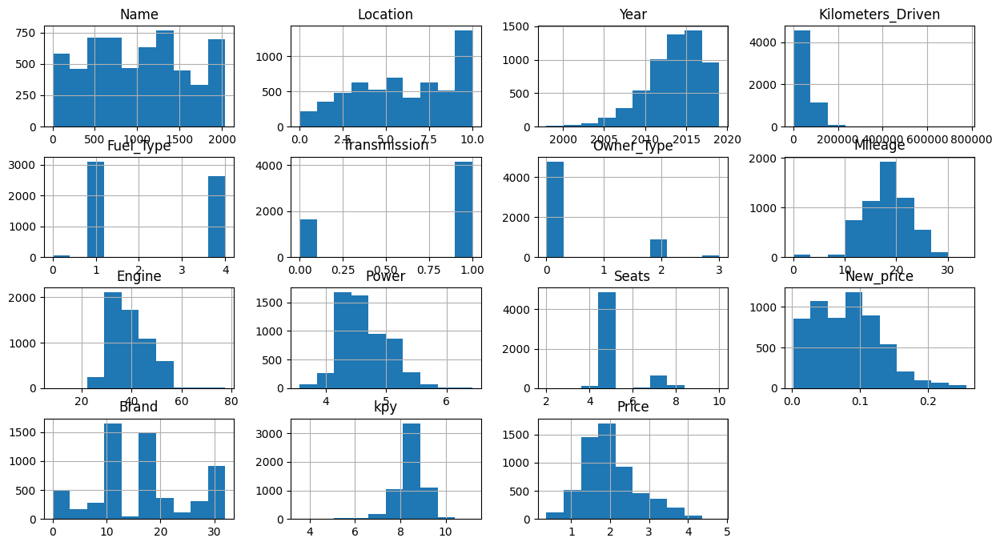

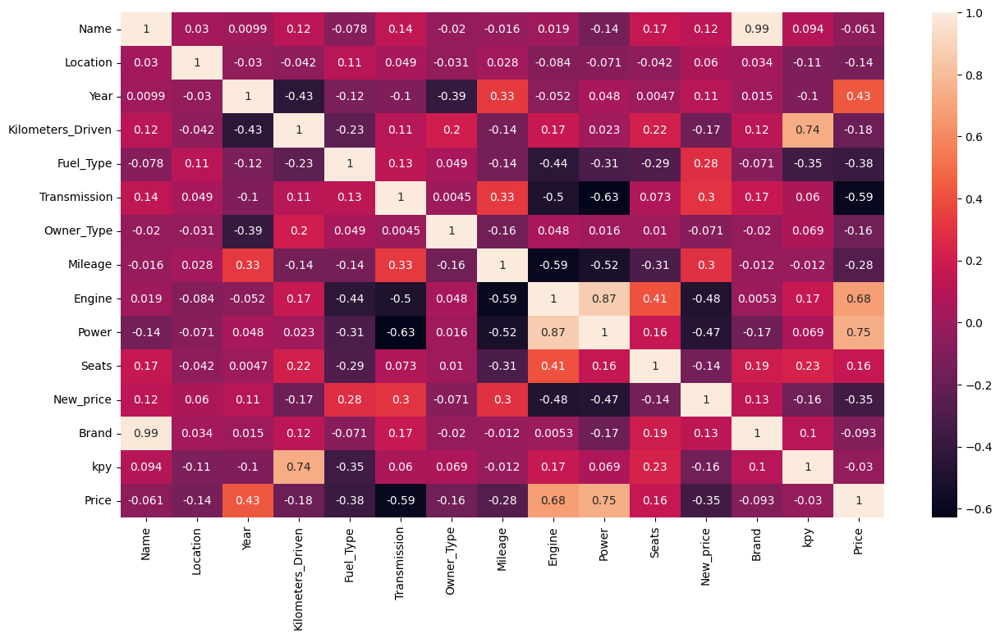

In [42]:
knn_Y_test, knn_Y_pred, knn_X_test, knn_X_train, knn_Y_train = run_regression(used_car_prices_df_knn_imputed_df_transformed)
# knn_residuals = knn_Y_test - knn_Y_pred

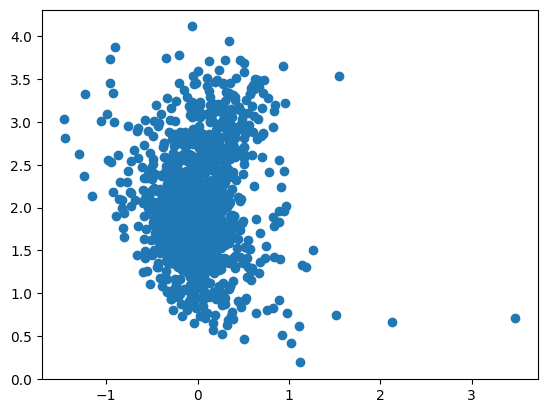

In [43]:
test_linearity(knn_Y_test, knn_Y_pred, knn_X_test)

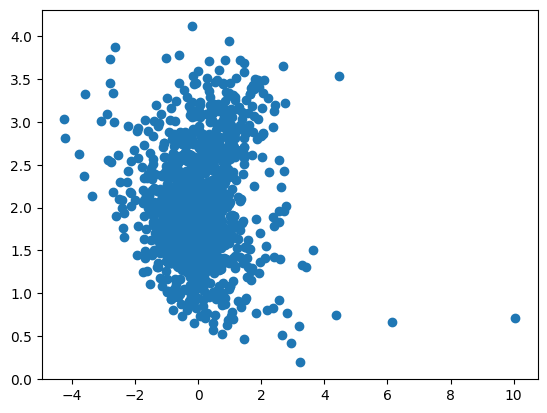

In [44]:
test_homoscedasticity(knn_X_test, knn_Y_pred)

Cols pre trewatment
Index(['S.No.', 'Name', 'Location', 'Year', 'Kilometers_Driven', 'Fuel_Type',
       'Transmission', 'Owner_Type', 'Mileage', 'Engine', 'Power', 'Seats',
       'New_price', 'Price', 'Brand', 'Name_CATEGORICAL',
       'Location_CATEGORICAL', 'Fuel_Type_CATEGORICAL',
       'Transmission_CATEGORICAL', 'Owner_Type_CATEGORICAL', 'kpy'],
      dtype='object')
Cols post trewatment
Index(['Name', 'Location', 'Year', 'Kilometers_Driven', 'Fuel_Type',
       'Transmission', 'Owner_Type', 'Mileage', 'Engine', 'Power', 'Seats',
       'New_price', 'Price', 'Brand', 'kpy'],
      dtype='object')
Regression Score: 0.700266494682696
Coefficients: 
 [ 4.60205332e-04 -1.38881027e-02  8.72784490e-02  1.11648531e-07
 -4.97752834e-02 -2.57181861e-01 -1.89851498e-02 -6.21980852e-03
  2.54609867e-02  4.81160177e-01 -1.58651018e-02  7.60594456e-02
 -3.23593352e-02 -5.93179486e-02]
Mean squared error: 0.14
Coefficient of determination: 0.70


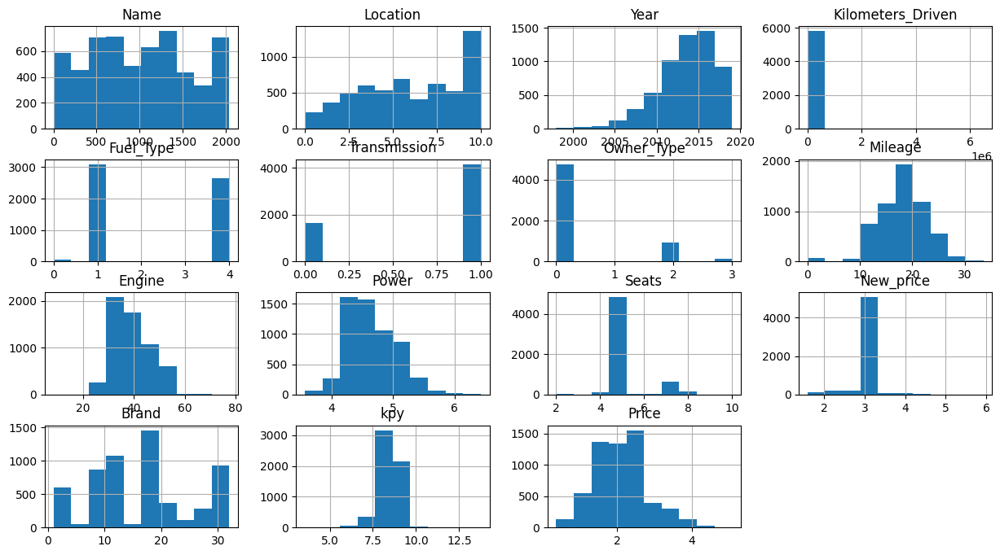

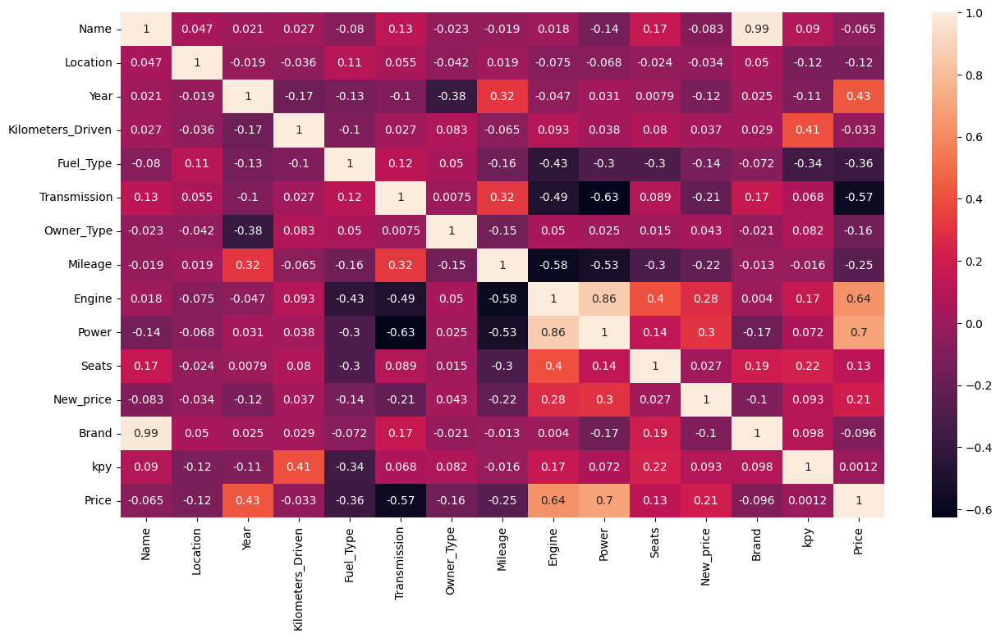

In [45]:
simple_Y_test, simple_Y_pred, simple_X_test, simple_X_train, simple_Y_train = run_regression(used_car_prices_df_simple_imputed_df_transformed)

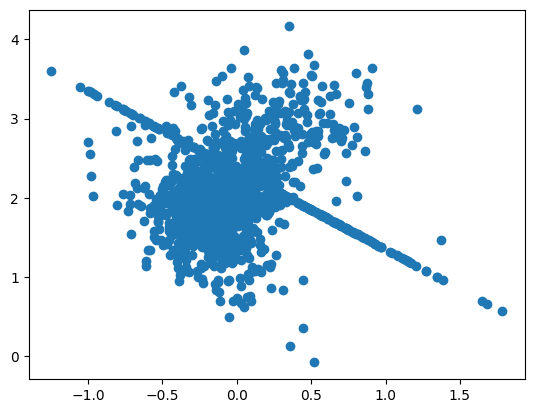

In [46]:
test_linearity(simple_Y_test, simple_Y_pred, simple_X_test)

Cols pre trewatment
Index(['S.No.', 'Name', 'Location', 'Year', 'Kilometers_Driven', 'Fuel_Type',
       'Transmission', 'Owner_Type', 'Mileage', 'Engine', 'Power', 'Seats',
       'New_price', 'Price', 'Brand', 'Name_CATEGORICAL',
       'Location_CATEGORICAL', 'Fuel_Type_CATEGORICAL',
       'Transmission_CATEGORICAL', 'Owner_Type_CATEGORICAL', 'kpy'],
      dtype='object')
Cols post trewatment
Index(['Name', 'Location', 'Year', 'Kilometers_Driven', 'Fuel_Type',
       'Transmission', 'Owner_Type', 'Mileage', 'Engine', 'Power', 'Seats',
       'New_price', 'Price', 'Brand', 'kpy'],
      dtype='object')
Regression Score: 0.8623312412601704
Coefficients: 
 [ 1.50686566e-03 -2.95345971e-02  1.93938327e-01  2.57081717e-07
 -1.12914485e-01 -3.74125744e-01 -6.67431268e-02 -5.19065262e-02
  4.11606304e-02  8.76972645e-02 -1.41062777e-01  6.61371167e-01
 -9.95780669e-02 -1.76976790e-01]
Mean squared error: 0.25
Coefficient of determination: 0.86


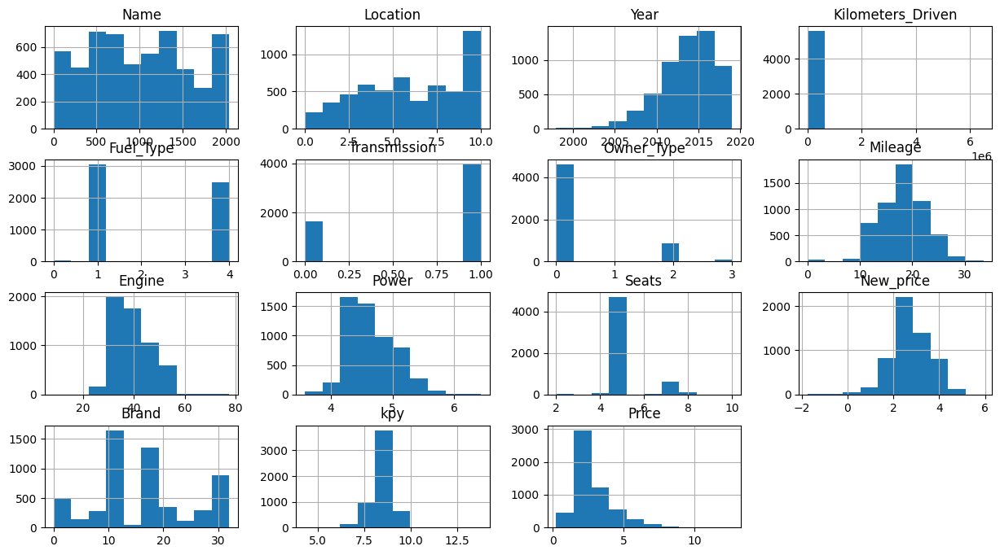

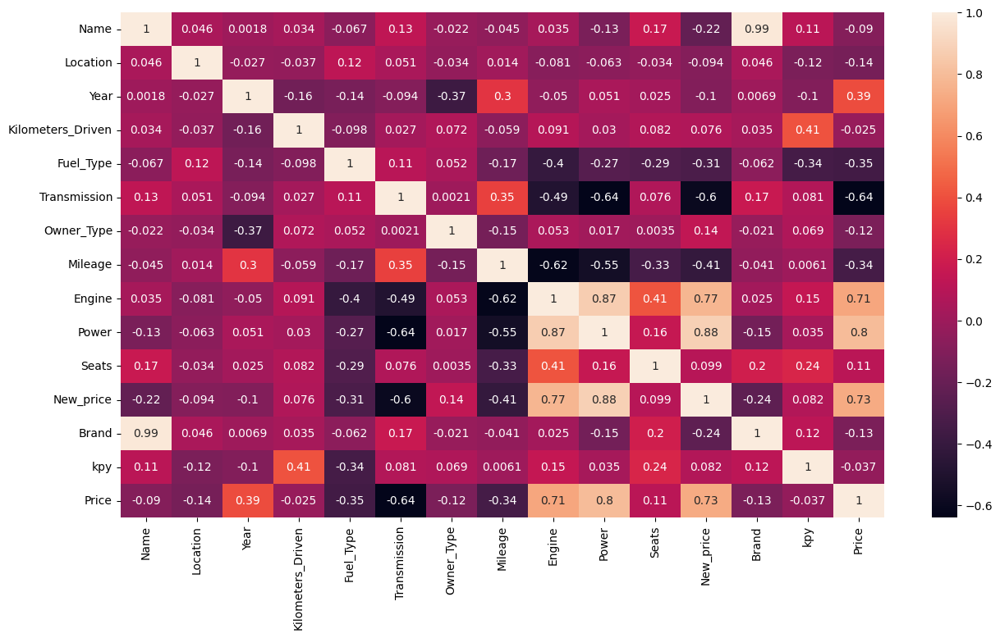

In [47]:
iterative_Y_test, iterative_Y_pred, iterative_X_test, iterative_X_train, iterative_Y_train = run_regression(used_car_prices_df_iterative_imputed_df_transformed.dropna())

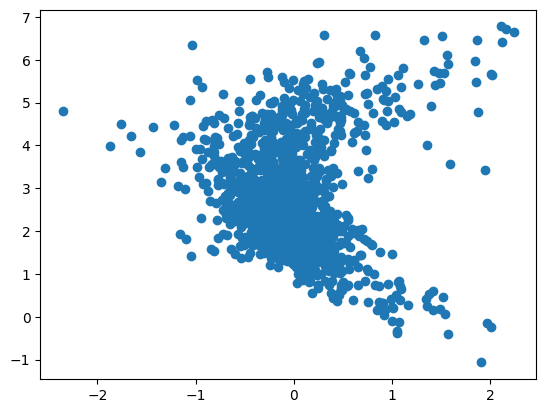

In [48]:
test_linearity(iterative_Y_test, iterative_Y_pred, iterative_X_test)

Cols pre trewatment
Index(['S.No.', 'Name', 'Location', 'Year', 'Kilometers_Driven', 'Fuel_Type',
       'Transmission', 'Owner_Type', 'Mileage', 'Engine', 'Power', 'Seats',
       'New_price', 'Price', 'Brand', 'kpy'],
      dtype='object')
Cols post trewatment
Index(['Name', 'Location', 'Year', 'Kilometers_Driven', 'Fuel_Type',
       'Transmission', 'Owner_Type', 'Mileage', 'Engine', 'Power', 'Seats',
       'New_price', 'Price', 'Brand', 'kpy'],
      dtype='object')
Regression Score: 0.8087862813875664
Coefficients: 
 [ 4.29823719e-03 -8.64248712e-03  8.84537924e-02 -2.90743601e-06
 -2.06657981e-01 -2.24347353e-01 -2.26407566e-02 -1.27015557e-02
 -5.51453256e+02 -6.73777192e+01 -3.49446353e-02 -2.28857289e+00
 -4.99211884e-02  1.67062170e-02]
Mean squared error: 0.12
Coefficient of determination: 0.81


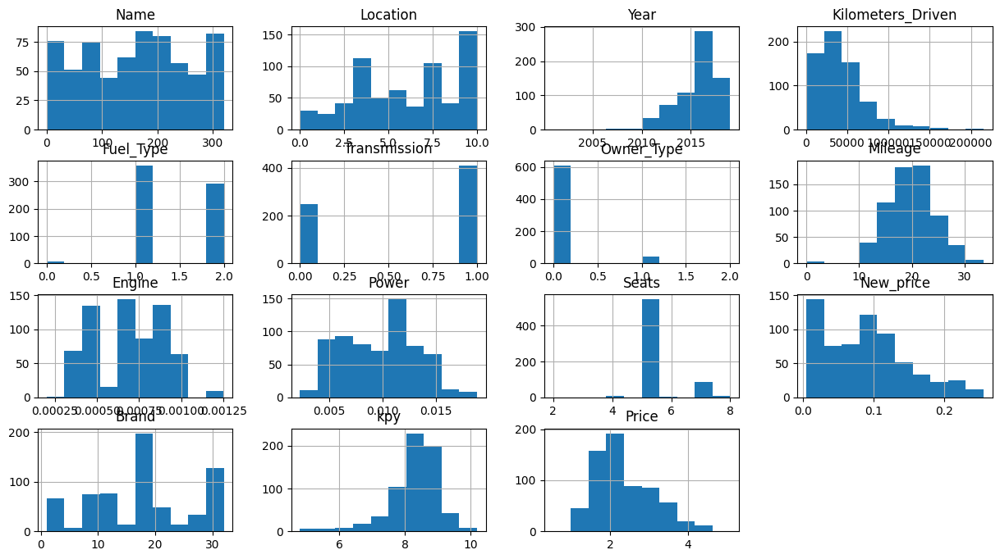

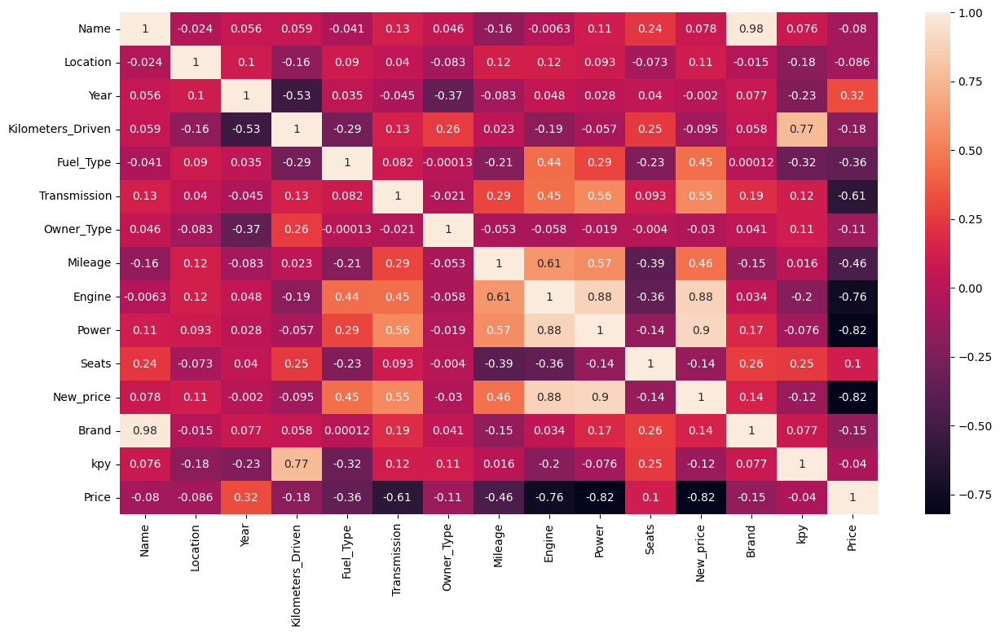

In [49]:
used_car_prices_df_dropna_transformed['Name'] = label_encoder.fit_transform(used_car_prices_df_dropna_transformed['Name'])
used_car_prices_df_dropna_transformed['Location'] = label_encoder.fit_transform(used_car_prices_df_dropna_transformed['Location'])
used_car_prices_df_dropna_transformed['Fuel_Type'] = label_encoder.fit_transform(used_car_prices_df_dropna_transformed['Fuel_Type'])
used_car_prices_df_dropna_transformed['Transmission'] = label_encoder.fit_transform(used_car_prices_df_dropna_transformed['Transmission'])
used_car_prices_df_dropna_transformed['Owner_Type'] = label_encoder.fit_transform(used_car_prices_df_dropna_transformed['Owner_Type'])

dropna_Y_test, dropna_Y_pred, dropna_X_test, dropna_X_train, dropna_Y_train = run_regression(used_car_prices_df_dropna_transformed)

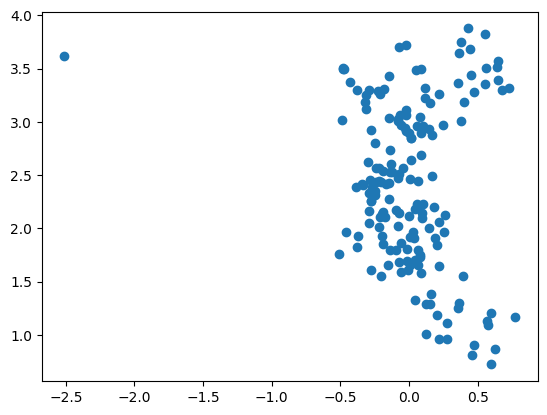

In [50]:
test_linearity(dropna_Y_test, dropna_Y_pred, dropna_X_test)

## **Bivariate Analysis**

**Questions: (Milestone)**

1. Plot a scatter plot for the log transformed values(if log_transformation done in previous steps)?
2. What can we infer form the correlation heatmap? Is there correlation between the dependent and independent variables?
3. Plot a box plot for target variable and categorical variable 'Location' and write your observations?

## **Building Various Models (Milestone)**


1. What we want to predict is the "Price". We will use the normalized version 'price_log' for modeling.
2. Before we proceed to the model, we'll have to encode categorical features. We will drop categorical features like Name.
3. We'll split the data into train and test, to be able to evaluate the model that we build on the train data.
4. Build Regression models using train data.
5. Evaluate the model performance.

# Random Forest

## Drop NA Data Set

In [59]:
from sklearn import preprocessing
dropna_data_scaler = preprocessing.StandardScaler()

dropna_X_train_scaled = dropna_data_scaler.fit_transform(dropna_X_train)

dropna_X_test = dropna_X_test.drop(["PREDICTED"], axis=1)
dropna_X_test = dropna_X_test.drop(["RESIDUALS"], axis=1)
# dropna_X_test_tmp = dropna_X_test_tmp.drop(["STD_RESIDUAL"], axis=1)
dropna_X_test_scaled = dropna_data_scaler.transform(dropna_X_test)

In [60]:
from sklearn import ensemble

dropna_data_forest = ensemble.RandomForestRegressor(oob_score=True)
dropna_data_forest.fit(dropna_X_train, dropna_Y_train)

RandomForestRegressor(oob_score=True)

In [61]:
dropna_data_forest.score(dropna_X_test, dropna_Y_test)

0.8697678628081017

In [62]:
dropna_data_forest.oob_score_

0.9487501887884153

In [63]:
run_predictions(dropna_data_forest, dropna_X_test, dropna_Y_test)

Mean squared error: 0.08
Coefficient of determination: 0.87


array([3.49018342, 1.89690613, 1.462498  , 3.33808856, 4.18029187,
       3.41999197, 2.31725709, 2.89764786, 1.56553081, 4.0856517 ,
       1.49385095, 2.41343229, 4.04516575, 1.78448686, 2.25820918,
       1.74297419, 3.19387113, 2.91014934, 3.40417698, 2.26746705,
       2.26443777, 3.49744297, 2.93680511, 1.75765132, 1.61984457,
       3.01492209, 2.1815557 , 2.27121512, 1.96111916, 2.25748044,
       2.31910592, 1.79236655, 3.94723976, 3.06236833, 2.6638901 ,
       1.66919721, 2.24660279, 2.1590693 , 1.60883436, 2.91941249,
       1.92443668, 2.89512695, 1.31499229, 1.8146789 , 3.01463719,
       3.22208407, 2.27584561, 3.1712467 , 3.4455755 , 4.10323097,
       2.41458533, 1.94446381, 2.51931462, 2.1461906 , 2.1316466 ,
       1.42973708, 1.55622776, 1.92313081, 2.24561535, 1.98888436,
       2.20427559, 2.32497239, 3.09298559, 2.24103585, 2.52414363,
       2.48925866, 1.69660114, 1.44324624, 2.9441505 , 1.8439666 ,
       3.04170505, 1.80676975, 2.14778999, 2.50490902, 1.85352

## KNN Data Set

In [64]:
from sklearn import preprocessing
knn_data_scaler = preprocessing.StandardScaler()

knn_X_train_scaled = knn_data_scaler.fit_transform(knn_X_train)
knn_X_test = knn_X_test.drop(["PREDICTED"], axis=1)
knn_X_test = knn_X_test.drop(["RESIDUALS"], axis=1)
knn_X_test = knn_X_test.drop(["STD_RESIDUAL"], axis=1)
knn_X_test_scaled = knn_data_scaler.transform(knn_X_test)


In [65]:
from sklearn import ensemble

knn_data_forest = ensemble.RandomForestRegressor()
knn_data_forest.fit(knn_X_train, knn_Y_train)

RandomForestRegressor()

In [66]:
knn_data_forest.score(knn_X_test, knn_Y_test)

0.824360470266037

In [67]:
run_predictions(knn_data_forest, knn_X_test, knn_Y_test)

Mean squared error: 0.09
Coefficient of determination: 0.82


array([1.95026003, 2.22294258, 2.06235431, ..., 1.95834628, 1.7995101 ,
       1.89294487])

### **Hyperparameter Tuning: Random Forest for Drop NA Dataset**


In [68]:
from sklearn import model_selection

dropna_data_forest_tuned = ensemble.RandomForestRegressor()

parameters = {
    # "n_estimators": [50, 100, 150], # default 100 -> original params but took default
    "min_samples_split": [4, 6, 8], # default 2
    # "max_depth": [None, 2, 4], # default None -> original param but took default
}

grid_search_dropna = model_selection.GridSearchCV(dropna_data_forest_tuned, parameters, cv=5, scoring="neg_mean_squared_error", return_train_score=True)
grid_search_dropna.fit(dropna_X_train_scaled, dropna_Y_train)

GridSearchCV(cv=5, estimator=RandomForestRegressor(),
             param_grid={'min_samples_split': [4, 6, 8]},
             return_train_score=True, scoring='neg_mean_squared_error')

In [69]:
grid_search_dropna.best_estimator_

RandomForestRegressor(min_samples_split=4)

In [70]:
grid_search_dropna.best_estimator_.score(dropna_X_test_scaled, dropna_Y_test)

0.8682692693053071

In [71]:
run_predictions(grid_search_dropna.best_estimator_, dropna_X_test_scaled, dropna_Y_test)

Mean squared error: 0.08
Coefficient of determination: 0.87


array([3.49659817, 1.92370289, 1.41626564, 3.36888683, 4.17784898,
       3.41308003, 2.31345197, 2.89664642, 1.60371186, 4.08526032,
       1.45984225, 2.40901138, 4.00163805, 1.77976609, 2.27441752,
       1.74229233, 3.17581296, 2.87913577, 3.40337897, 2.28364293,
       2.28402252, 3.48655878, 2.94444713, 1.72923961, 1.62209525,
       3.00601123, 2.18102821, 2.26499313, 1.96444272, 2.27418496,
       2.32792521, 1.77102318, 3.97775236, 3.03476211, 2.60826863,
       1.64955799, 2.23839464, 2.19335922, 1.60933712, 2.91298626,
       1.95095559, 2.85106289, 1.31497666, 1.81426191, 3.00581138,
       3.22109474, 2.29014483, 3.1817218 , 3.42496112, 4.05018744,
       2.40962432, 1.94660433, 2.51926692, 2.15556681, 2.10650379,
       1.41439976, 1.55837671, 1.94182626, 2.17466839, 1.9918264 ,
       2.20562816, 2.34245664, 3.10669459, 2.24954115, 2.52132966,
       2.48142409, 1.70187727, 1.43694806, 2.90487026, 1.88303229,
       3.04820939, 1.77853614, 2.14198991, 2.50200586, 1.86168

### **Hyperparameter Tuning: Random Forest for KNN Imputed Dataset**

In [72]:
from sklearn import model_selection

knn_data_forest_tuned = ensemble.RandomForestRegressor()
# Initial Params
# parameters = {
#     "n_estimators": [50, 100, 150], # default 100
#     "min_samples_split": [2,4], # default 2
#     "max_depth": [None, 2, 4], # default None
# }
parameters = {
    "n_estimators": [250, 300, 350], # default 100
    "min_samples_split": [6, 8, 10] # default 2
}


grid_search = model_selection.GridSearchCV(knn_data_forest_tuned, parameters, cv=5, scoring="neg_mean_squared_error", return_train_score=True)
grid_search.fit(knn_X_train_scaled, knn_Y_train)

GridSearchCV(cv=5, estimator=RandomForestRegressor(),
             param_grid={'min_samples_split': [6, 8, 10],
                         'n_estimators': [250, 300, 350]},
             return_train_score=True, scoring='neg_mean_squared_error')

In [73]:
grid_search.best_estimator_

RandomForestRegressor(min_samples_split=6, n_estimators=300)

In [74]:
grid_search.best_estimator_.score(knn_X_test_scaled, knn_Y_test)

0.8259497813513388

In [75]:
run_predictions(grid_search.best_estimator_, knn_X_test_scaled, knn_Y_test)

Mean squared error: 0.09
Coefficient of determination: 0.83


array([1.96380697, 2.21284009, 2.03351798, ..., 1.87621627, 1.82726542,
       1.88820811])

# Decision Tree

## DT for Drop NA Data

In [76]:
from sklearn.tree import DecisionTreeRegressor

dropna_data_dtregressor = DecisionTreeRegressor(random_state=0)
dropna_data_dtregressor.fit(dropna_X_train_scaled, dropna_Y_train)

DecisionTreeRegressor(random_state=0)

In [77]:
dropna_data_dtregressor.score(dropna_X_test_scaled, dropna_Y_test)

0.7883105136648435

In [78]:
run_predictions(dropna_data_dtregressor, dropna_X_test_scaled, dropna_Y_test)

Mean squared error: 0.13
Coefficient of determination: 0.79


array([3.60195898, 1.93152141, 1.73871025, 3.23356737, 4.3795235 ,
       3.39952932, 2.29455292, 2.86220088, 1.70474809, 3.63758616,
       1.25276297, 2.35137526, 4.05577697, 1.76644166, 2.16332303,
       1.60943791, 3.14587493, 2.94021956, 3.32359614, 2.22462355,
       2.2512918 , 3.62434093, 2.86220088, 1.91692261, 1.6311994 ,
       3.25114939, 2.14358936, 2.25654115, 2.01490302, 2.37024374,
       2.19722458, 1.74919985, 4.04305127, 2.93651291, 2.52572864,
       1.89461685, 2.39333946, 2.12823171, 1.43508453, 2.86220088,
       2.10413415, 3.15912582, 1.42310833, 1.77495235, 3.25114939,
       3.39952932, 2.22462355, 3.24921102, 3.40119738, 4.58568151,
       2.35137526, 1.79175947, 2.52572864, 2.14006616, 2.09186406,
       1.28093385, 1.56861592, 2.11263451, 1.98100147, 2.04769284,
       2.09186406, 2.5168897 , 3.17763708, 2.24601474, 2.36649842,
       2.56494936, 1.65822808, 1.28093385, 3.15912582, 1.64865863,
       3.06805294, 1.76985463, 1.92424865, 2.36649842, 1.79175

## DT for KNN Imputed Data


In [79]:
from sklearn.tree import DecisionTreeRegressor

knn_data_dtregressor = DecisionTreeRegressor(random_state=0)
knn_data_dtregressor.fit(knn_X_train_scaled, knn_Y_train)

DecisionTreeRegressor(random_state=0)

In [80]:
knn_data_dtregressor.score(knn_X_test_scaled, knn_Y_test)

0.6567022767662463

In [81]:
run_predictions(knn_data_dtregressor, knn_X_test_scaled, knn_Y_test)

Mean squared error: 0.18
Coefficient of determination: 0.66


array([2.00821403, 2.46385324, 2.13771045, ..., 2.28289246, 2.00148   ,
       1.74221902])

### **Hyperparameter Tuning: Decision Tree for Drop NA Data**



In [82]:
dropna_data_dtregressor_tuned = DecisionTreeRegressor(criterion="squared_error", max_depth=10, min_samples_split=10, random_state=5)
dropna_data_dtregressor_tuned.fit(dropna_X_train_scaled, dropna_Y_train)

DecisionTreeRegressor(max_depth=10, min_samples_split=10, random_state=5)

In [83]:
dropna_data_dtregressor_tuned.score(dropna_X_test_scaled, dropna_Y_test)

0.8045814347897128

In [85]:
from sklearn.model_selection import cross_val_score
cross_val_score(dropna_data_dtregressor_tuned, dropna_X_train_scaled, dropna_Y_train)

array([0.92661092, 0.92158517, 0.86393045, 0.91188545, 0.86624443])

### **Hyperparameter Tuning: Decision Tree for Knn Imputed Data**



In [86]:
knn_data_dtregressor_tuned = DecisionTreeRegressor(criterion="squared_error", max_depth=10, min_samples_split=10, random_state=5)
knn_data_dtregressor_tuned.fit(knn_X_train_scaled, knn_Y_train)

DecisionTreeRegressor(max_depth=10, min_samples_split=10, random_state=5)

In [87]:
knn_data_dtregressor_tuned.score(knn_X_test_scaled, knn_Y_test)

0.7432412627456183

In [88]:
cross_val_score(knn_data_dtregressor_tuned, knn_X_train_scaled, knn_Y_train)

array([0.68603975, 0.75440882, 0.72264272, 0.68509784, 0.73291831])

# Lasso Regression

## Lasso for Drop NA Data

In [ ]:
# todo

### **Hyperparameter Tuning: Lasso for Drop NA Data**

In [ ]:
# todo

## Lasso for KNN Imputed Data


In [ ]:
# todo

### **Hyperparameter Tuning: Lasso for KNN Imputed Data**

In [ ]:
# todo

# Ridge Regression

## Ridge for Drop NA Data

In [ ]:
# todo

### **Hyperparameter Tuning: Ridge for Drop NA Data**

In [ ]:
# todo

## Ridge for KNN Imputed Data


In [ ]:
# todo

### **Hyperparameter Tuning: Ridge for KNN Imputed Data**

In [ ]:
# todo

## **Conclusions and Recommendations**

### Best Data sets
- Drop NA
- KNN Imputed

### Best Models
- Drop NA
  - Simple Linear Regression: 0.8716044221290786 score with 0.07 MSE and 0.87 Coefficient of determination
  - Random Forest: 0.9534567780892036 score with 0.03 MSE and 0.95 Coefficient of determination
- KNN Imputed
  - Simple Linear Regression: 0.7536688638748281 score with 0.12 MSE and 0.75 Coefficient of determination
  - Random Forest: 0.7980638900298804 score with 0.10 MSE and 0.80 Coefficient of determination

**3. Proposal for the final solution design:**
- What model do you propose to be adopted? Why is this the best solution to adopt?
### Based on my findings Drop NA Dataset with the Random Forest
- 0.9534567780892036 score
- 0.03 MSE
- 0.95 Coefficient of determination

### Possible Next Steps
- Try out Lasso model
- More tuning for Random forest

## **Conclusions and Recommendations**

### Best Data sets
- Drop NA
- KNN Imputed

### Best Models
- Drop NA
  - Simple Linear Regression: 0.8716044221290786 score with 0.07 MSE and 0.87 Coefficient of determination
  - Random Forest: 0.9534567780892036 score with 0.03 MSE and 0.95 Coefficient of determination
- KNN Imputed
  - Simple Linear Regression: 0.7536688638748281 score with 0.12 MSE and 0.75 Coefficient of determination
  - Random Forest: 0.7980638900298804 score with 0.10 MSE and 0.80 Coefficient of determination

**3. Proposal for the final solution design:**
- What model do you propose to be adopted? Why is this the best solution to adopt?
### Based on my findings Drop NA Dataset with the Random Forest
- 0.9534567780892036 score
- 0.03 MSE
- 0.95 Coefficient of determination

In [ ]:
%%shell
jupyter nbconvert --to html /content/Dewey_Capstone_Project_Reference_Notebook_Full_Code_Used_Cars_Price_Prediction.ipynb